In [447]:
library('hdp')
library('clusterCrit')
library('grid')
library('gridExtra')
library('ggplot2')
library('ggrepel')
library('RColorBrewer')
library('dplyr')
library('reshape2')
library('IRdisplay')
library('scales')
library('survival')
source('../../../src/tools.R')     # custom tools function
source('../../../src/hdp_tools_yanis.R')
###       
source("../../../src/merge_df.R")
source("../../../src/my_toolbox.R")
source("../../../src/my_components.R")
source("../../../src/my_utils.R")
source("../../../src/ggstyles.R")
source("../../../src/my_hotspots.R")
###


theme_set(theme_minimal())

# set jupyer notebook parameters
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 200, # set the maximum number of rows displayed
        repr.matrix.max.cols = 200) # set the maximum number of columns displayed


---

# Some useful functions 


In [432]:
plottings_comparison <-function(df1,df2=NULL,df3=NULL,df4=NULL,df5=NULL,df6=NULL,x1="", x2="",x3="",x4="",x5="",x6="",many=2,width=8,height=2){
    
    print (paste(paste("Count",x1,sep=" : "),toString(dim(df1)[1]),sep=" : "))
    print (paste(paste("Count",x2,sep=" : "),toString(dim(df2)[1]),sep=" : "))    
    if(many>=3){print(paste(paste("Count",x3,sep=" : "),toString(dim(df3)[1]),sep=" : "))}
    if(many>=4){print(paste(paste("Count",x4,sep=" : "),toString(dim(df4)[1]),sep=" : "))}
    if(many>=5){print(paste(paste("Count",x5,sep=" : "),toString(dim(df5)[1]),sep=" : "))}
    if(many>=6){print(paste(paste("Count",x6,sep=" : "),toString(dim(df6)[1]),sep=" : "))}
    
    val=c("0" = "brown2", "1" = "dimgray", "2" = "darkorange2", "3" ="greenyellow", "4"="ivory")
    set_notebook_plot_size(width,height)
    theme_1 = theme(axis.text.x = element_blank(),axis.ticks.x = element_blank())
    
    for (col in binary_correlates){ 
        p1 <-ggplot(df1, aes(factor(comparison), fill = factor(df1[,col]))) + 
            geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x1,fill=col)+
            scale_fill_manual(values = val) + theme_1
        if (many==1){
            plot(p1)
        }else if (many==2){
            p2 <-ggplot(df2, aes(factor(comparison), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,nrow=1)
        }else if (many==3){
            p2 <-ggplot(df2, aes(factor(comparison), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p3 <-ggplot(df3, aes(factor(comparison), fill = factor(df3[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x3,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,p3,nrow=1)
        }else if (many==4){
            p2 <-ggplot(df2, aes(factor(comparison), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+xlab(x2)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p3 <-ggplot(df3, aes(factor(comparison), fill = factor(df3[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x3,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p4 <-ggplot(df4, aes(factor(comparison), fill = factor(df4[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x4,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,p3,p4,nrow=1)
        }
    }
    for (col in continuous_correlates){
        mini=suppressWarnings(min(min(df1[,col],na.rm=T),min(df2[,col],na.rm=T),min(df3[,col],na.rm=T),min(df4[,col],na.rm=T),na.rm=T))
        maxi=suppressWarnings(max(max(df1[,col],na.rm=T),max(df2[,col],na.rm=T),max(df3[,col],na.rm=T),max(df4[,col],na.rm=T),na.rm=T))
 
        p1 <- ggplot(df1,aes(x=factor(comparison),y=df1[,col],fill=comparison)) +
                geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x1)+ylim(mini,maxi) + theme_1
        if (many==1){
            suppressWarnings(plot(p1))
        }else if(many==2){
            p2 <- ggplot(df2,aes(x=factor(comparison),y=df2[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x2)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,nrow=1))
        }else if(many==3){
            p2 <- ggplot(df2,aes(x=factor(comparison),y=df2[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x2)+ylim(mini,maxi)
            p3 <- ggplot(df3,aes(x=factor(comparison),y=df3[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x3)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,p3,nrow=1))
        }else if(many==4){
            p2 <- ggplot(df2,aes(x=factor(comparison),y=df2[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x2)+ylim(mini,maxi) + theme_1
            p3 <- ggplot(df3,aes(x=factor(comparison),y=df3[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x3)+ylim(mini,maxi) + theme_1
            p4 <- ggplot(df4,aes(x=factor(comparison),y=df4[,col],fill=comparison)) +
                    geom_boxplot(aes(fill = factor(comparison))) +  ylab(col)+xlab(x4)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,p3,p4,nrow=1))
        }
    }
}

In [431]:
plottings <-function(df1,df2=NULL,df3=NULL,df4=NULL,df5=NULL,df6=NULL,x1="with NPM1", x2="without NPM1",x3="",x4="",x5="",x6="",many=2,width=8,height=2){
    print (paste(paste("Count",x1,sep=" : "),toString(dim(df1)[1]),sep=" : "))
    print (paste(paste("Count",x2,sep=" : "),toString(dim(df2)[1]),sep=" : "))    
    if(many>=3){print(paste(paste("Count",x3,sep=" : "),toString(dim(df3)[1]),sep=" : "))}
    if(many>=4){print(paste(paste("Count",x4,sep=" : "),toString(dim(df4)[1]),sep=" : "))}
    if(many>=5){print(paste(paste("Count",x5,sep=" : "),toString(dim(df5)[1]),sep=" : "))}
    if(many>=6){print(paste(paste("Count",x6,sep=" : "),toString(dim(df6)[1]),sep=" : "))}
    
    val=c("0" = "brown2", "1" = "dimgray", "2" = "darkorange2", "3" ="greenyellow", "4"="ivory")
    set_notebook_plot_size(width,height)
    theme_1 = theme(axis.text.x = element_blank(),axis.ticks.x = element_blank())
    
    for (col in binary_correlates){ 
        p1 <-ggplot(df1, aes(factor(predicted_component), fill = factor(df1[,col]))) + 
            geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x1,fill=col)+
            scale_fill_manual(values = val) + theme_1
        if (many==1){
            plot(p1)
        }else if (many==2){
            p2 <-ggplot(df2, aes(factor(predicted_component), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,nrow=1)
        }else if (many==3){
            p2 <-ggplot(df2, aes(factor(predicted_component), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p3 <-ggplot(df3, aes(factor(predicted_component), fill = factor(df3[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x3,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,p3,nrow=1)
        }else if (many==4){
            p2 <-ggplot(df2, aes(factor(predicted_component), fill = factor(df2[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+xlab(x2)+labs(x=x2,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p3 <-ggplot(df3, aes(factor(predicted_component), fill = factor(df3[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x3,fill=col)+
                scale_fill_manual(values = val) + theme_1
            p4 <-ggplot(df4, aes(factor(predicted_component), fill = factor(df4[,col]))) + 
                geom_bar(position = "fill") +scale_y_continuous(labels = scales::percent)+labs(x=x4,fill=col)+
                scale_fill_manual(values = val) + theme_1
            grid.arrange(p1,p2,p3,p4,nrow=1)
        }
    }
    for (col in continuous_correlates){
        mini=suppressWarnings(min(min(df1[,col],na.rm=T),min(df2[,col],na.rm=T),min(df3[,col],na.rm=T),min(df4[,col],na.rm=T),na.rm=T))
        maxi=suppressWarnings(max(max(df1[,col],na.rm=T),max(df2[,col],na.rm=T),max(df3[,col],na.rm=T),max(df4[,col],na.rm=T),na.rm=T))
 
        p1 <- ggplot(df1,aes(x=factor(predicted_component),y=df1[,col],fill=predicted_component)) +
                geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x1)+ylim(mini,maxi) + theme_1
        if (many==1){
            suppressWarnings(plot(p1))
        }else if(many==2){
            p2 <- ggplot(df2,aes(x=factor(predicted_component),y=df2[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x2)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,nrow=1))
        }else if(many==3){
            p2 <- ggplot(df2,aes(x=factor(predicted_component),y=df2[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x2)+ylim(mini,maxi) + theme_1
            p3 <- ggplot(df3,aes(x=factor(predicted_component),y=df3[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x3)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,p3,nrow=1))
        }else if(many==4){
            p2 <- ggplot(df2,aes(x=factor(predicted_component),y=df2[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x2)+ylim(mini,maxi) + theme_1
            p3 <- ggplot(df3,aes(x=factor(predicted_component),y=df3[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x3)+ylim(mini,maxi) + theme_1
            p4 <- ggplot(df4,aes(x=factor(predicted_component),y=df4[,col],fill=predicted_component)) +
                    geom_boxplot(aes(fill = factor(predicted_component))) +  ylab(col)+xlab(x4)+ylim(mini,maxi) + theme_1
            suppressWarnings(grid.arrange(p1,p2,p3,p4,nrow=1))
        }
    }
}

In [3]:
plot_surv <-function(df_surv,title=""){
    #set_notebook_plot_size(10,10)
    surv_object <- Surv(time = df_surv$os, event = df_surv$os_status)
    fit1 <- survfit(surv_object ~ comparison, data = df_surv)
    ggsurvplot(fit1, data = df_surv, pval = TRUE,risk.table = TRUE,ggtheme = theme_minimal(),
    risk.table.y.text.col = T,
    risk.table.y.text = T,break.time.by = 1,title= title)
}

---

# I-Heatmap with inv3 as requested by Elli

##### This is the heatmap after active learning HDP Clustering 
##### Why active learning? Because after our optimised HDP Clustering selected with a GridSearch, we were only able to find maximum 11 components (including component 0).

##### Among those 11 components, I decided to reapply a clustering algorithm to component 0, 2 and 4 . At the end, we were able to have 15 components and the component 0 disappeared.

##### The continuous blue line separates the clusters from the first HDP and the dot ones are formed when we reapply HDP to component 0,2 and 4.

In [4]:
df_all_components <- read.table("../../../data/updated_dataset/all_components.tsv",sep = '\t' , header = T)
df_initial <- read.table("../../../data/initial_dataset/Master_04_10_2019.csv",sep = ',' , header = T)

In [6]:
rownames(df_initial) <- df_initial$data_pd
df_initial <- df_initial[,-1:-4]

In [7]:
tmp_all <- df_all_components[order(df_all_components$predicted_component),]
transp_df_all <-(as.data.frame(t(tmp_all)))
transp_df_all$features <- rownames(transp_df_all)
transp_df_all <- transp_df_all[-nrow(transp_df_all),]
melt.data_all<-melt(transp_df_all,id.vars ="features", variable_name=colnames(transp_df_all))

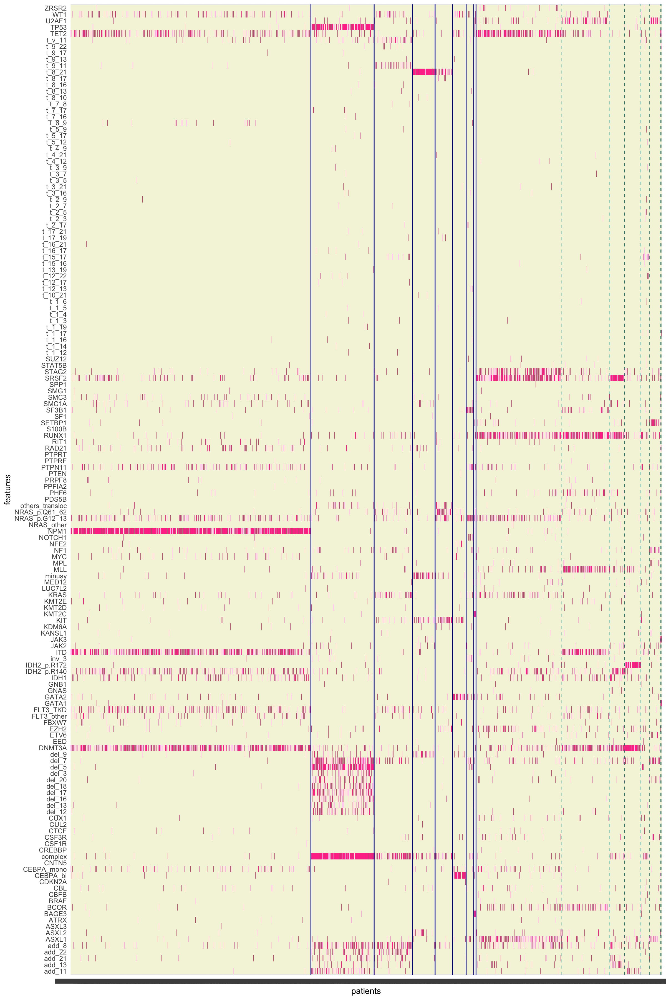

In [8]:
options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_all_components$predicted_component)   ## to separate by component
# plot the heatmap
ggplot(melt.data_all, aes(variable,features)) +
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c('0' = 'beige', '1' = 'violetred1')) +
geom_vline(xintercept = cumsum(col_sep)[1:8] + 0.5, col = 'darkblue', linetype = 1, size = 0.5) +
geom_vline(xintercept = cumsum(col_sep)[9:15] + 0.5, col = 'cyan4', linetype = 2, size = 0.3) +
labs(x = 'patients') 

##### This allows us to find the component that Elli wanted :SF3BP1 and inv3

# II-Clinical correlates whole cohort

# II.1 - Prepare dataframe with correlates

In [627]:
correlates <- c("gender","age","ahd","perf_status","bm_blasts","secondary","wbc","hb","plt","os","cr","os_status","cod")
binary_correlates <- c("gender","ahd","perf_status","secondary","os_status","cr")
continuous_correlates <- c("age","wbc","hb","plt","bm_blasts","os","cod")

In [10]:
df_w_correlates <- merge(df_initial[correlates],df_all_components['predicted_component'],by=0)
rownames(df_w_correlates) <- df_w_correlates$Row.names
df_w_correlates <- df_w_correlates [,-1]

# II.2 - Clinical correlates for categorical variables

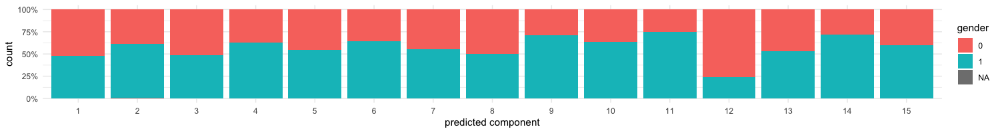

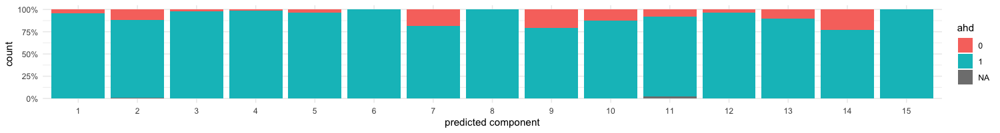

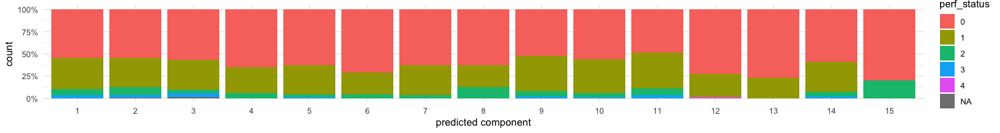

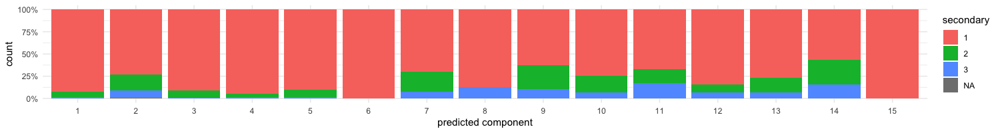

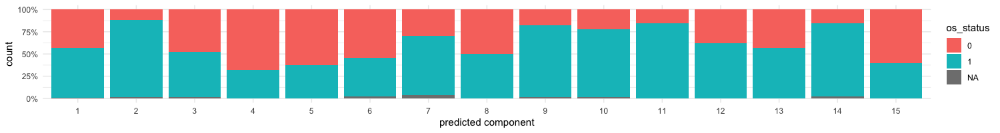

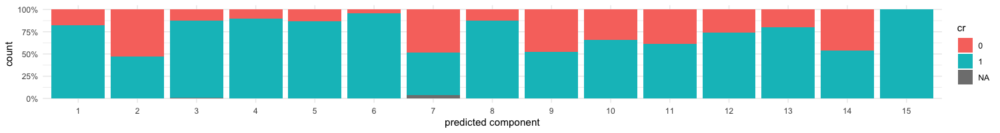

In [453]:
set_notebook_plot_size(15,2)
for (col in binary_correlates){
p <- ggplot(df_w_correlates, aes(factor(predicted_component), fill = factor(df_w_correlates[,col]))) +
  geom_bar(position = "fill") +
  scale_y_continuous(labels = scales::percent)+
  xlab("predicted component")+
  labs(fill=col)
    plot(p)
}

# II.3 - Clinical correlates for continuous variables

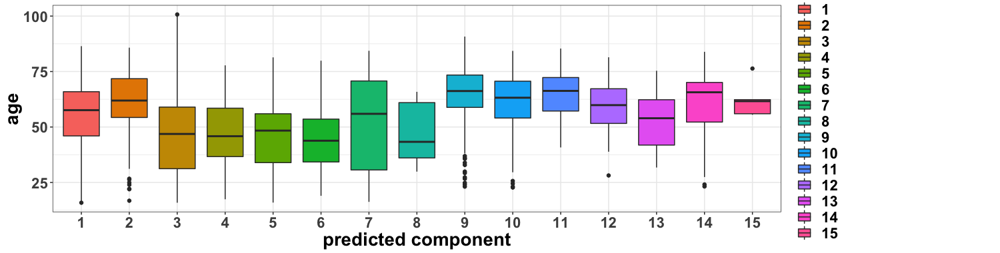

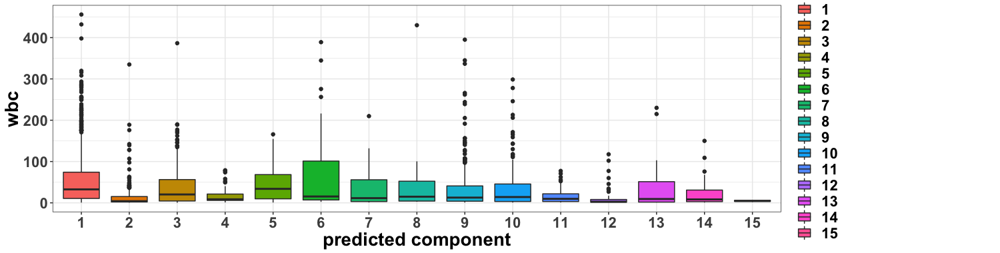

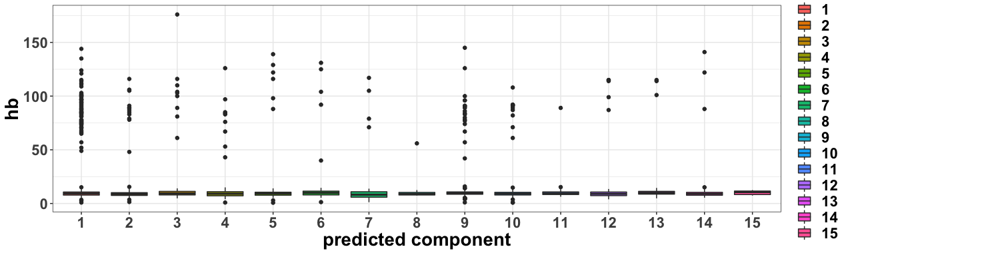

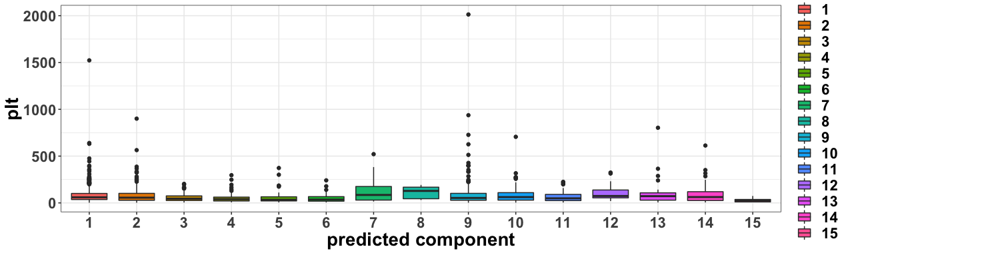

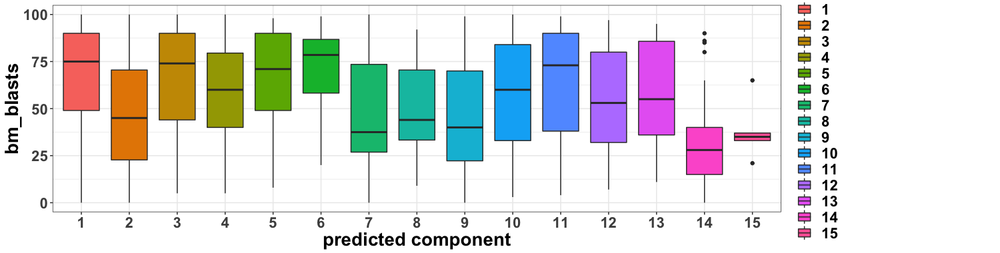

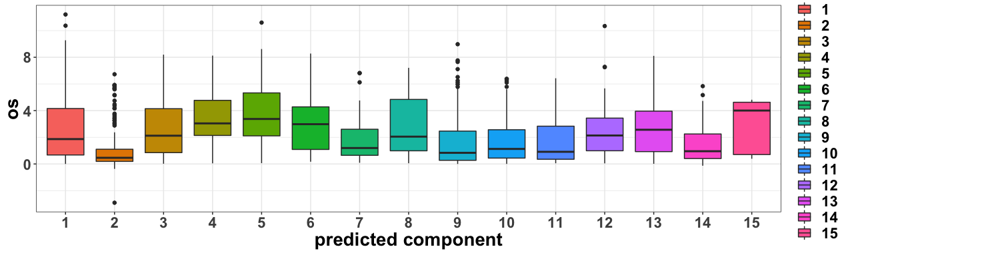

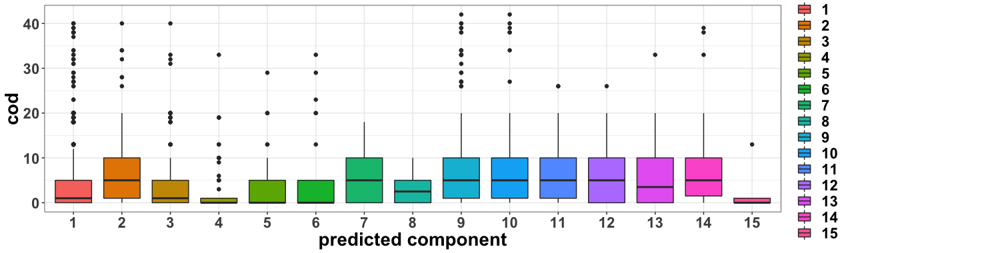

In [455]:
set_notebook_plot_size(15,3.8)
for (col in continuous_correlates){
    p <- ggplot(df_w_correlates,aes(x=factor(predicted_component),y=df_w_correlates[,col],fill=predicted_component)) +
    geom_boxplot(aes(fill = factor(predicted_component))) + theme1+
    ylab(col)+xlab("predicted component")
    suppressWarnings(plot(p))
    
}

In [13]:
surv_object <- Surv(time = df_w_correlates$os, event = df_w_correlates$os_status)


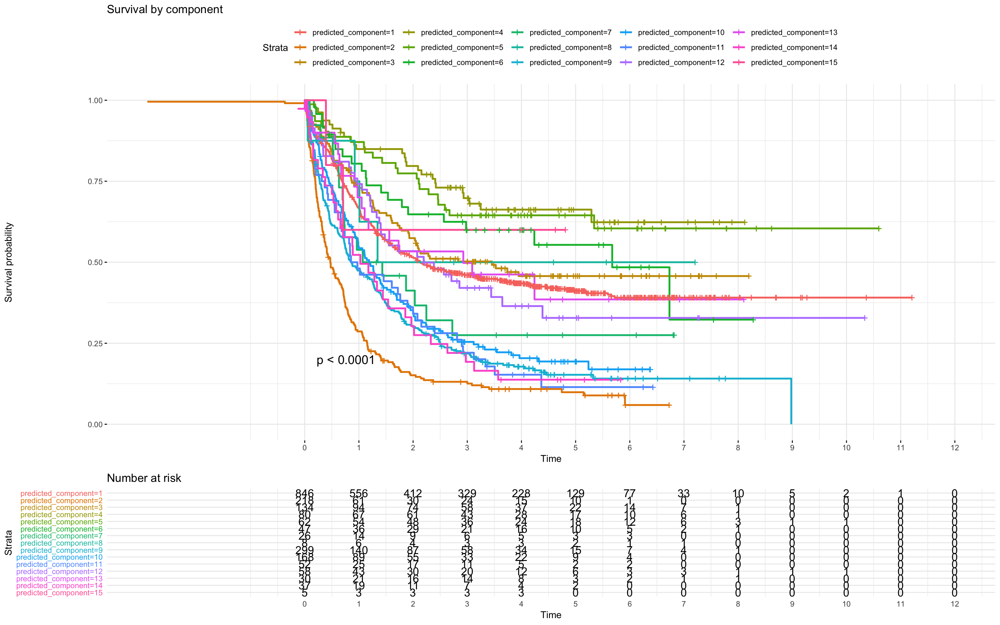

In [14]:

set_notebook_plot_size(16,10)
fit1 <- survfit(surv_object ~ predicted_component, data = df_w_correlates)

ggsurvplot(fit1, data = df_w_correlates, pval = TRUE,risk.table = TRUE,ggtheme = theme_minimal(),
 risk.table.y.text.col = T,
  risk.table.y.text = T,break.time.by = 1,title= "Survival by component")
#plotly(p)

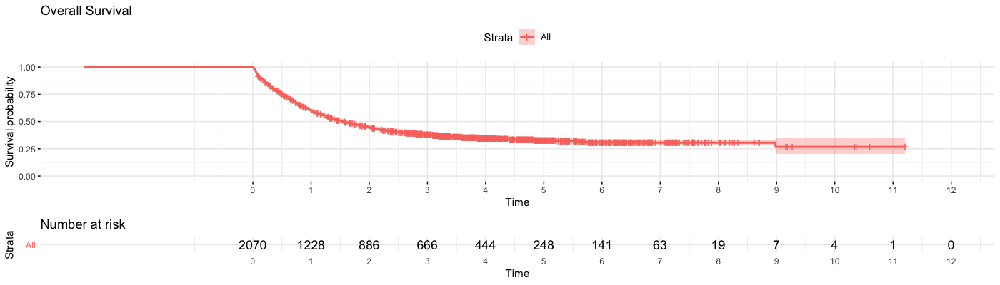

In [417]:
set_notebook_plot_size(14,4)
fit_all <- survfit(surv_object ~1, data = df_w_correlates)
ggsurvplot(fit_all, data = df_w_correlates, risk.table = TRUE,ggtheme = theme_minimal(),
 risk.table.y.text.col = T,
  risk.table.y.text = T,break.time.by = 1,title="Overall Survival")



# Takeaways of the analysis:

###  [For Component 1](#comp1):
##### We have identified that __NPM1__ mutation has a significantly positive impact on survival outcome than people without __NPM1__ in component 1 and all others without __NPM1__.
##### However, for people not in component 1 the survival outcome with __NPM1__ is very bad (Problem: only 14 samples for people not in C1 with __NPM1__)



###  [For Component 2](#comp2):
##### Combination of __TP53__ and __complex__ has a negative impact on survival outcome . 
##### __TP53__ without complex seems to be the main driver for the negative impact because it still has a negative impact on survival outcome whereas
##### complex without __TP53__ seems to follow the overall survival curve.

###  [Confirmation of conclusion of component 2 with component 3](#comp2-3):
##### Whereas complex only performs slightly better than overall for component 3 , the combination of __complex__ and __TP53__ of component 2 has a significant negative impact on survival.
##### Regarding clinical correlates, the comparison shows that complete remission is very high for component 3 with __complex__ whereas very low for component 2 with __complex__ and __TP53__.

###  [For Component 3](#comp3):
##### It seems that translocations __t_v_11__ and __t_9_11__ performs similarly for survival outcomes with a slightly positice effect. 
##### For translocation __t_15_17__, it seems to have as well a positive impact on the overall survival.
##### Regarding overlap, there is only one patient with __t_v_11__ and __t_9_11__ so we can not draw conclusions.

###  [For Component 4](#comp4minusy):
#### [Component 4 minusy with translocation(8,21) ](#comp4minusy):
##### The survival when __minusy__ is 0 and with __translocation(8,21)__ is slightly better than the survival when __minusy__ is 1 with this __translocation(8,21)__.
##### Overall, whatever the outcome of __minusy__ , the survival is positively impacted by __translocation(8,21)__.  
#### [Component 4 KIT with translocation(8,21) ](#comp4KIT):
##### __Translocation(8,21)__ combined with mutation __KIT__ performs less well than __translocation(8,21)__ without this mutation. Overall, the survival curves for both have still a positive impact on survival.
##### This means that __translocation(8,21)__ has a dominant positive effect over mutation __KIT__.

###  [Confirmation of conclusion of component 4 with component 5](#comp4-5):
##### Again, we can see that __translocation(8,21)__ has a clear positive impact on survival outcome . The combination with the mutation __KIT__ tends to shrink slightly this positive impact
##### and it is still true that the __translocation(8,21)__ is dominant over __KIT__ mutation.

###  [All component KIT and t(8,21)](#t_8_21):
##### This concludes our previous remarks: __translocation(8,21)__ significantly increases the overall survival . When combined with __KIT__ mutation , the survival tends to go down but the effect of 
##### this __translocation(8,21)__ is still widely dominating 

###  [For Component 5](#comp5):
##### __NRAS__ seems to have a similar impact as __KIT__ when combined with the __translocation(8,21)__. Indeed, the combination seems to reduce the survival but the __translocation(8,21)__
##### impact is dominating so the overall impact is positive.


###  [All component NRAS and t(8,21)](#NRAS):
##### Same conclusion as mutation __KIT__.

###  [For Component 6](#comp6):
##### The mutations __GATA2__ and __CEBPAbi__ seems to have a positive impact on survival . When combined, the effect of those mutations is slightly reduced.

###  [For Component 7](#comp7):
#### [SF3B1,inv3 and del7](#comp7):
##### All together, they seem to have a negative impact on the survival when combined. However, the results are not significant to draw conclusionssince the number of patients with those 3 mutations is very low(3 patients).
#### [SF3B1,inv3](#comp7_bis):
##### When we look at the combination of __SF3B1__ and __inv3__, we can deduce that the dominant negative effect comes from the __inv3__ .

###  [For Component 8](#comp8):
##### __BAGE3__ and __KMT2C__ appears mutated together all the time.

###  [For New Component 1 and 2 ](#nc1-2):
##### We have compared new component 1 and 2 with new component 1 with __SRSF2__,__RUNX1__ and __STAG2__ mutations combined VS new component 1 for others VS new component 2 with __U2AF1__ and __MLL__
##### combined VS others from component 2 VS all others. Thanks to those comparisons, the results show that the new component 1 with her mutations has the worse significant negative
##### impact on  the survival followed by the new component 2 with her mutations followed by others in new component 1 and 2. Therefore, we can say with confidence that those mutations ,
##### when combined together significantly lower the survival.

###  [For New Component 2 ](#nc2):
##### With high confidence , we can say that the survival of people with DNMT3A and ITD in the new component 2 is far worse then for other people with those mutations .
##### Also, it is far worse than other people in the new component 2 without those 2 mutations. 
##### This , leads us to ask another questions: what other mutations might be responsible when DNMT3A and ITD are mutated?


### [Investigation](#investigation):
##### To investigate this, we need to find which mutations that are happening in the new component 2 but that are not happening within the other components when __DNMT3A__ and __ITD__ are mutated.
##### This is the frequency of MLL and RUNX1 mutations when __DNMT3A__ and __RUNX1__ are mutated. We can see that in new component 2 , those 2 mutations have a very high frequency,
##### whereas for other components, their frequency is very low.
##### All together with the survival plot, it shows that the combination of those 4 mutations considerably reduce the survival.

### [Comparison new component 1 and new component 3](#nc1-3):
##### The new component 3 with __SRSF2__ mutation have a better survival outcome than new component 1 with __SRSF2__ mutation

### [For New Component 4](#nc4):
##### Mutation __IDH2__ tends to delay the death of patients that have the __DNMT3A__ mutation which is known as a bad mutation for survival prognosis. 

### [For New component 5](#nc5):
##### __Translocation(15,17)__ significantly increase overall survival within the different components. 

### [For New component 6](#nc6):
##### Mutations __U2AF1__ combined with __SETBP1__ are the worst combination for new component 6 and obviosuly performs worse than overall survival.
##### After that, there are mutations __U2AF1__ combined with __NF1__ that also performs worse than overall survival.
##### This leads to the next investigation: how does mutation __U2AF1__ performs for all the components and not just new component 6?

### [Investigation U2AF1](#u2af1):
##### As previously guessed, the mutation __U2AF1__ for the whole dataset and not only for new component 6 significantly decreases the survival.

### [For New component 7](#nc7):
##### It seems that when GATA1 and JAK3 are mutated together, the survival is very low. However , a single mutation of __GATA1__ or __JAK3__ does not have this effect on the survival. Please be careful, that the number of patients for this conclusion is very low...

# III- Analysis by component

# Component 1

#### For component 1, the predominant feature is NMP1. Therefore , we will investigated the clinical correlates with and without this mutation.

In [422]:
df_c_1 <- merge(df_w_correlates,df_initial["NPM1"],by=0)
rownames(df_c_1) <- df_c_1$Row.names
df_c_1 <- df_c_1 [,-1]

[1] "Count : C1_NPM1 : 668"
[1] "Count : others_NPM1 : 14"
[1] "Count : C1_without : 183"
[1] "Count : others_without : 1229"


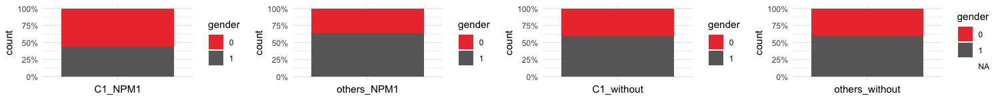

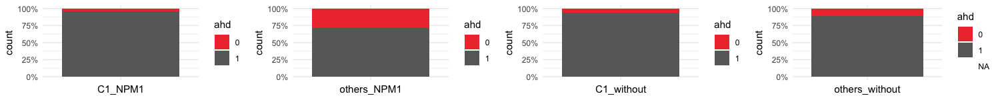

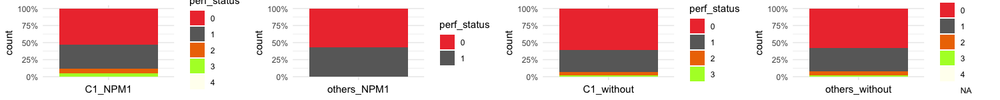

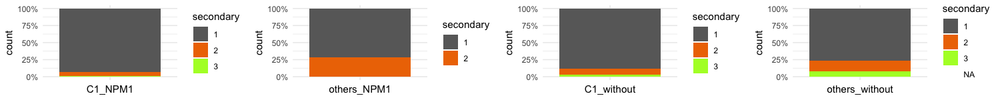

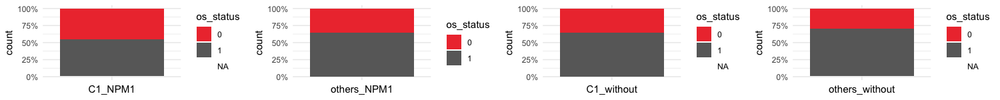

...

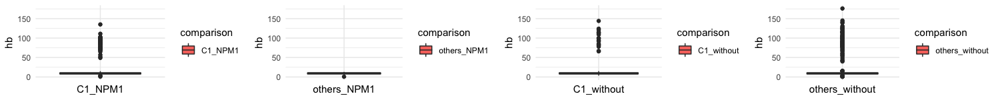

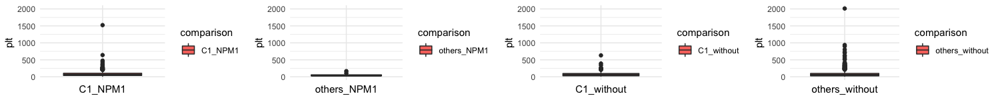

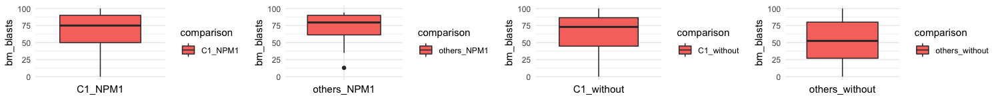

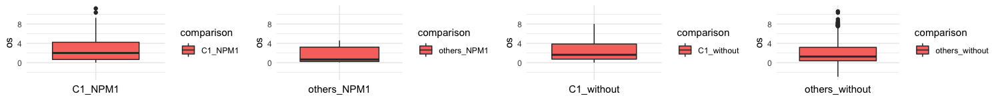

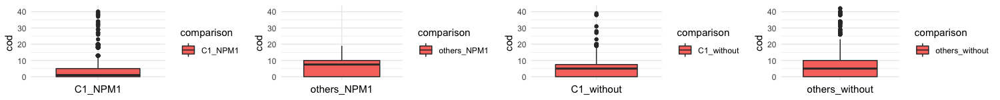

In [433]:
df_c_1$comparison <- ifelse((df_c_1$predicted_component==1)& (df_c_1$NPM1==1), "C1_NPM1", 
                     ifelse((df_c_1$predicted_component==1)& (df_c_1$NPM1==0), "C1_without",
                            ifelse((df_c_1$predicted_component!=1)& (df_c_1$NPM1==1), "others_NPM1","others_without" )))

plottings_comparison(df_c_1[df_c_1$comparison=="C1_NPM1",],df_c_1[df_c_1$comparison=="others_NPM1",],
                     df_c_1[df_c_1$comparison=="C1_without",],df_c_1[df_c_1$comparison=="others_without",],
                     many=4,x1="C1_NPM1",x2="others_NPM1",x3="C1_without",x4="others_without",width=15,height=1.5)

<a id='comp1'></a>


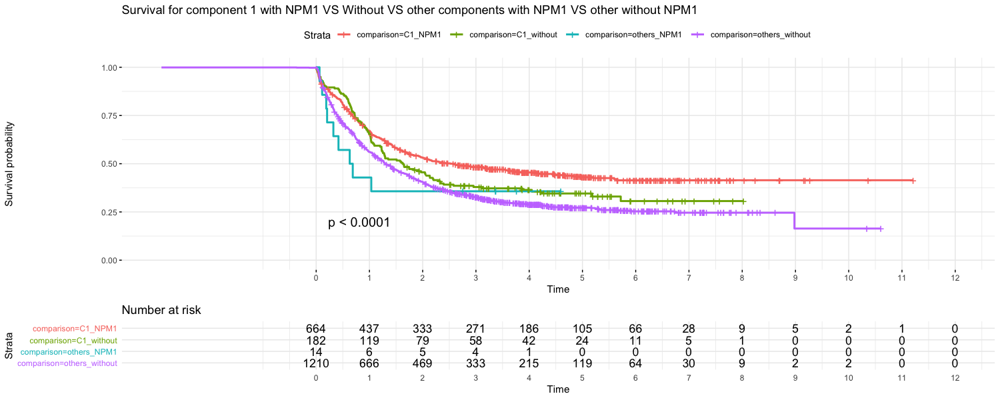

In [434]:
set_notebook_plot_size(15,6)
plot_surv(df_c_1,"Survival for component 1 with NPM1 VS Without VS other components with NPM1 VS other without NPM1")

# Component 2

#### The second component(correspond to component3 because of the new components) focuses on the additions, deletions, complex and TP53.

In [439]:
df_c_2 <- merge(df_w_correlates,df_initial[c("TP53","complex")],by=0)
rownames(df_c_2) <- df_c_2$Row.names
df_c_2 <- df_c_2 [,-1]

[1] "Count : C2_complex_TP53 : 150"
[1] "Count : C2_complex_only : 52"
[1] "Count : C2_TP53_only : 7"
[1] "Count : C2_without_both : 15"


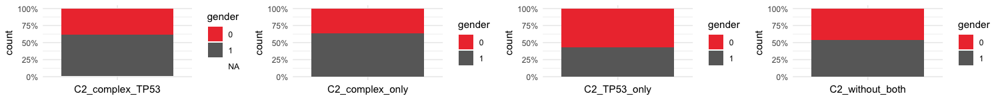

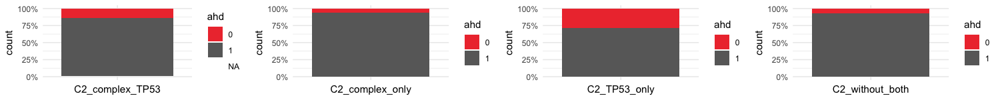

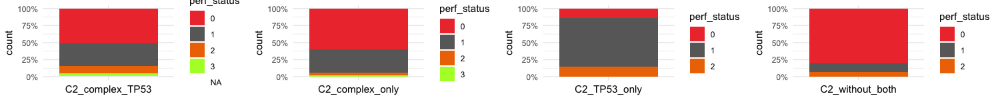

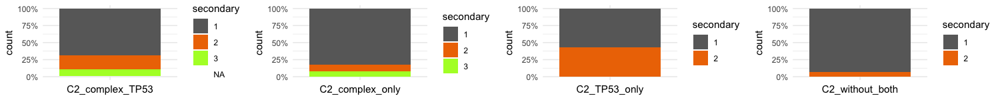

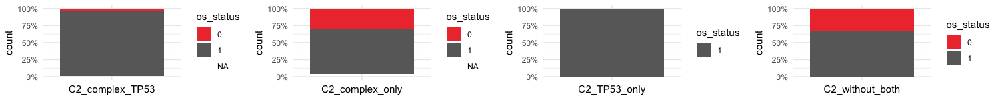

...

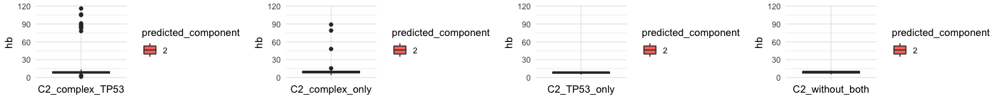

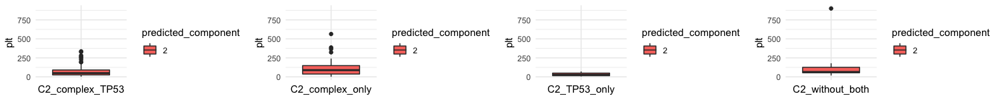

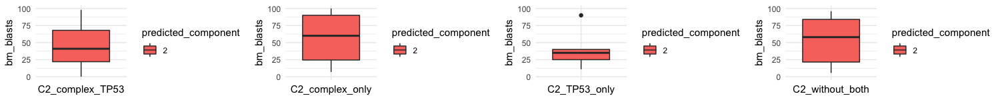

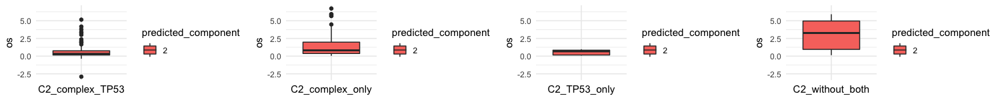

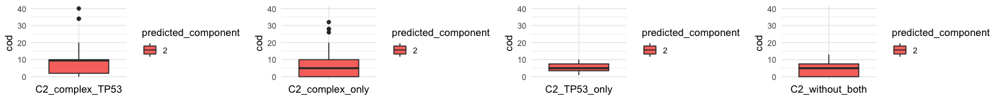

In [440]:
df_c_2$comparison <- ifelse((df_c_2$predicted_component==2)& (df_c_2$complex==1) & (df_c_2$TP53==1), "C2_complex_TP53", 
                     ifelse((df_c_2$predicted_component==2)& (df_c_2$complex==1) & (df_c_2$TP53==0), "C2_complex_only",
                            ifelse((df_c_2$predicted_component==2)& (df_c_2$complex==0) & (df_c_2$TP53==1), "C2_TP53_only",
                                   ifelse((df_c_2$predicted_component==2)& (df_c_2$complex==0) & (df_c_2$TP53==0),"C2_without_both",
                                   "others" ))))

plottings(df_c_2[(df_c_2$predicted_component==2)& (df_c_2$complex==1) & (df_c_2$TP53==1),],
          df_c_2[(df_c_2$predicted_component==2)& (df_c_2$complex==1) & (df_c_2$TP53==0),],
          df_c_2[(df_c_2$predicted_component==2)& (df_c_2$complex==0) & (df_c_2$TP53==1),],
          df_c_2[(df_c_2$predicted_component==2)& (df_c_2$complex==0) & (df_c_2$TP53==0),],
          x1="C2_complex_TP53",x2="C2_complex_only",x3="C2_TP53_only",x4="C2_without_both",many=4,width=15,height=1.5)

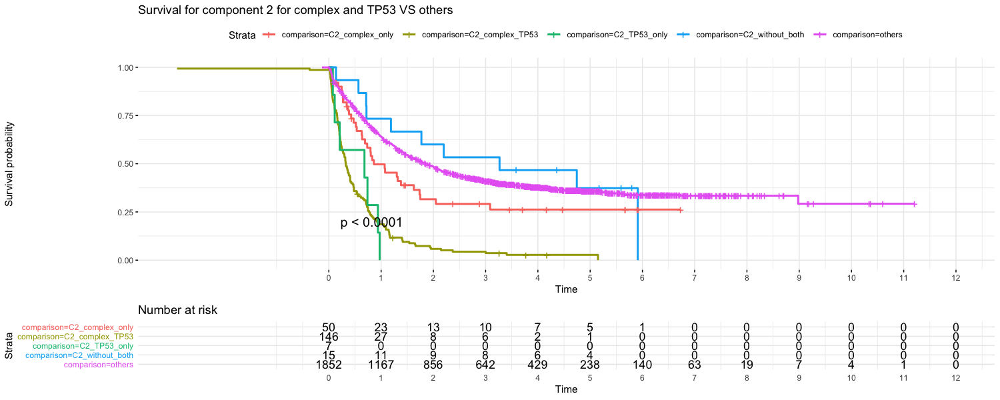

In [456]:
set_notebook_plot_size(15,6)
plot_surv(df_c_2,"Survival for component 2 for complex and TP53 VS others")

<a id='comp2'></a>

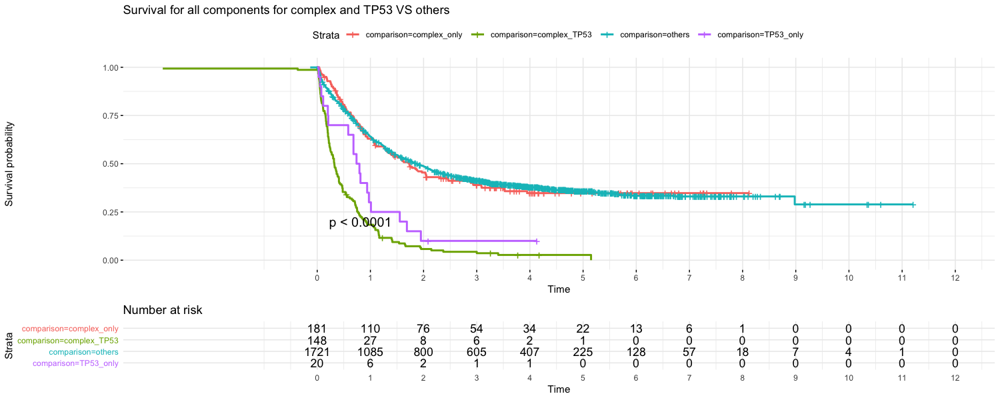

In [459]:
tmp <-df_c_2
tmp$comparison <- ifelse((tmp$complex==1) & (tmp$TP53==1), "complex_TP53", 
                     ifelse( (tmp$complex==1) & (tmp$TP53==0), "complex_only",
                            ifelse((tmp$complex==0) & (tmp$TP53==1), "TP53_only",
                                   "others" )))
set_notebook_plot_size(15,6)
plot_surv(tmp,"Survival for all components for complex and TP53 VS others")

# Component 3

## I- Let's compare when complex is activated in component 2 vs component 3 with TP53 activated for component 2

In [460]:
df_c_3 <- merge(df_w_correlates,df_all_components[c("TP53","complex","t_9_11","t_v_11","t_15_17","add_8")],by=0)
rownames(df_c_3) <- df_c_3$Row.names
df_c_3 <- df_c_3 [,-1]

[1] "Count : C3_complex_only : 55"
[1] "Count : C2_complex_AND_TP53 : 150"


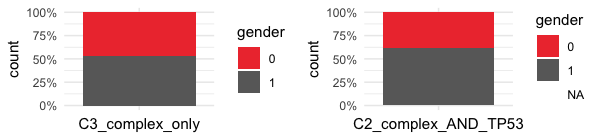

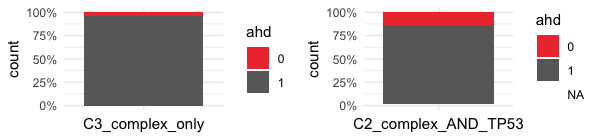

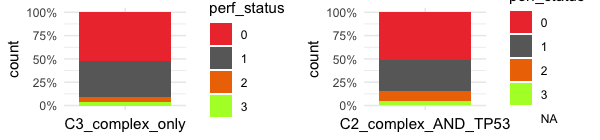

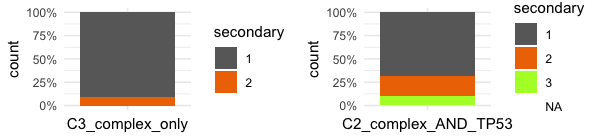

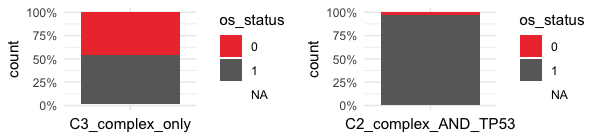

...

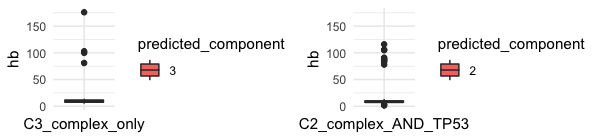

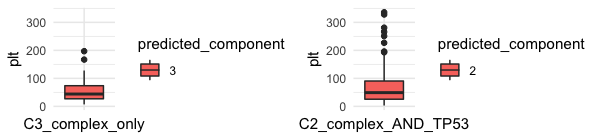

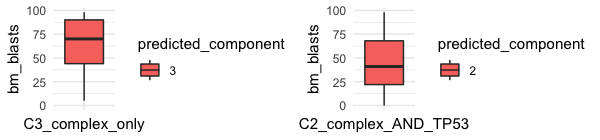

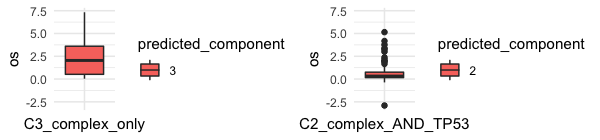

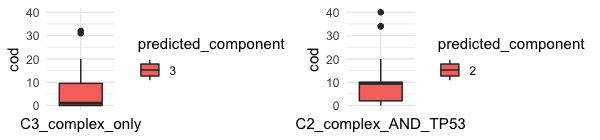

In [471]:
df_c_3$comparison <- ifelse((df_c_3$predicted_component==3)& (df_c_2$complex==1) & (df_c_2$TP53==0), "C3_complex_only", 
                     ifelse((df_c_3$predicted_component==2)& (df_c_2$complex==1) & (df_c_2$TP53==1), "C2_complex_AND_TP53",
                                   "others" ))
plottings(df_c_3[(df_c_3$predicted_component==3)& (df_c_3$complex==1) & (df_c_2$TP53==0),],
          df_c_3[(df_c_3$predicted_component==2)& (df_c_3$complex==1) & (df_c_2$TP53==1),],
          x1="C3_complex_only",x2="C2_complex_AND_TP53",many=2,width=6,height=1.4)

<a id='comp2-3'></a>

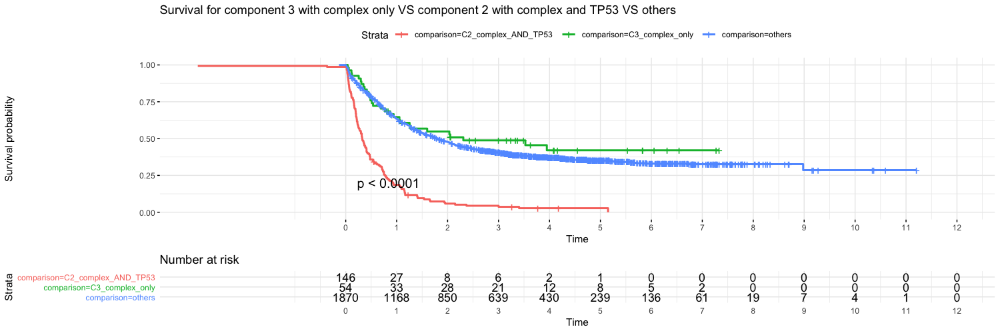

In [472]:
set_notebook_plot_size(15,5)
plot_surv(df_c_3,"Survival for component 3 with complex only VS component 2 with complex and TP53 VS others")

## II- Let's compare when add8

[1] "Count : C3_add8 : 46"
[1] "Count : C3_no_add8 : 90"


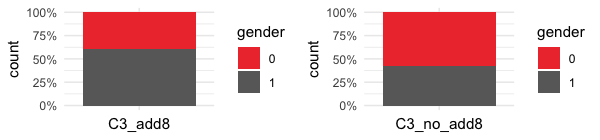

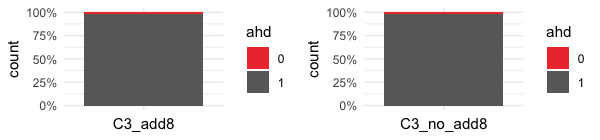

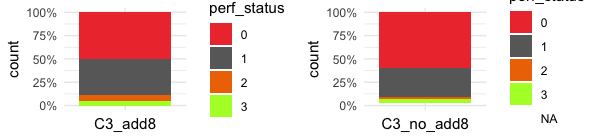

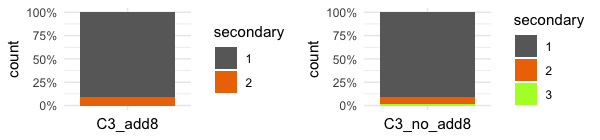

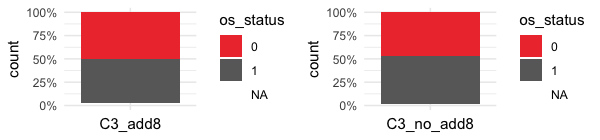

...

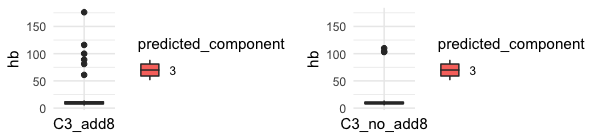

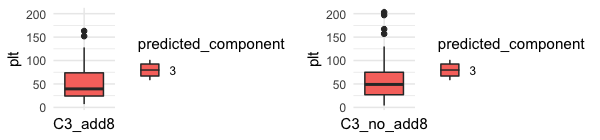

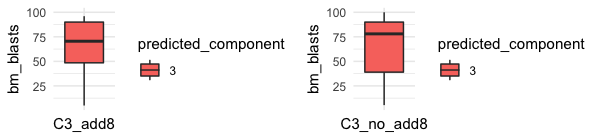

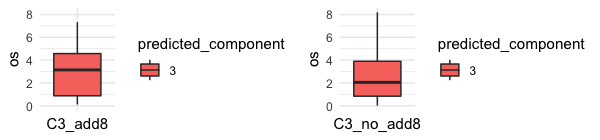

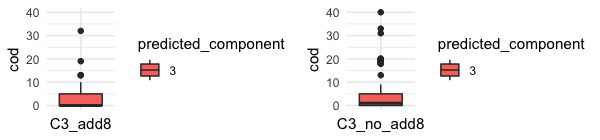

In [475]:
df_c_3$comparison <- ifelse((df_c_3$predicted_component==3) & (df_c_3$add_8==1), "C3_add8", 
                     ifelse((df_c_3$predicted_component==3)& (df_c_3$add_8==0) , "C3_no_add8",
                                   "others" ))
plottings(df_c_3[(df_c_3$predicted_component==3)& (df_c_3$add_8==1),],
          df_c_3[(df_c_3$predicted_component==3)& (df_c_3$add_8==0),],
          x1="C3_add8",x2="C3_no_add8",many=2,width=6,height=1.4)

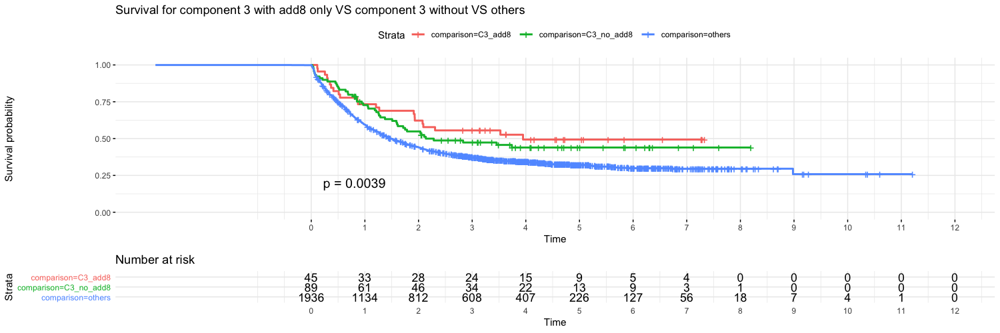

In [476]:
set_notebook_plot_size(15,5)
plot_surv(df_c_3,"Survival for component 3 with add8 only VS component 3 without VS others")

## III- t_v_11,t_9_11,t_15_17 and overlap

[1] "Count : C3_t_v_11_AND_t_9_11 : 1"
[1] "Count : C3_t_v_11_only : 27"
[1] "Count : C3_t_9_11_only : 27"
[1] "Count : C3_t_15_17_only : 9"


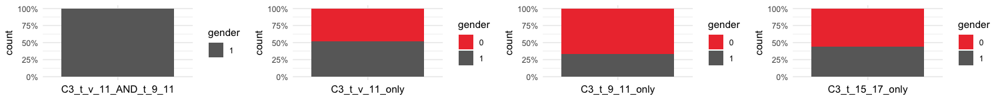

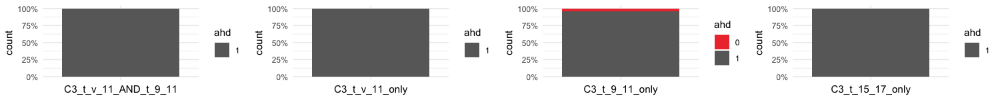

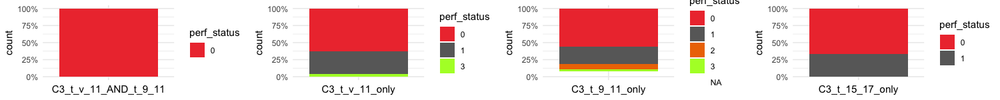

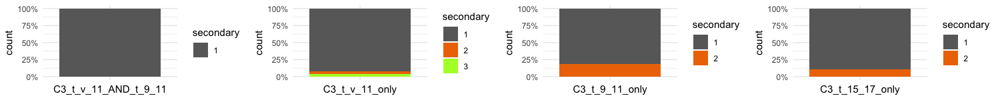

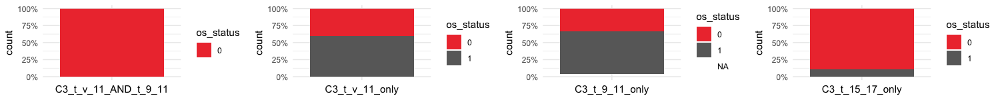

...

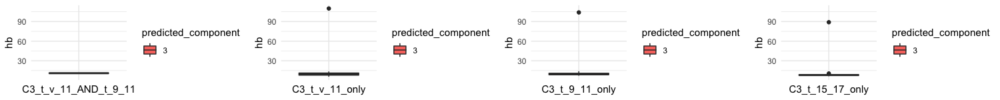

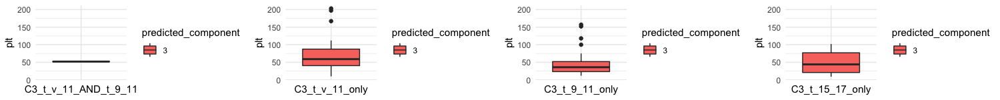

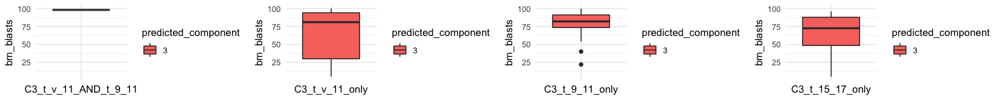

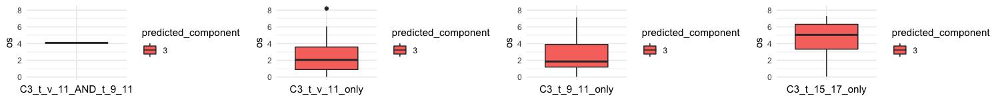

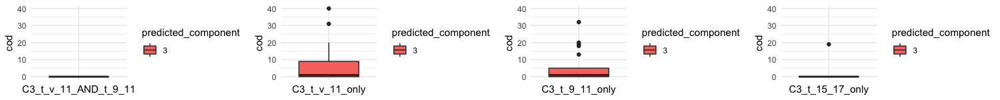

In [481]:
df_c_3$comparison <- ifelse((df_c_3$predicted_component==3) & (df_c_3$t_v_11==1) & (df_c_3$t_9_11==1), "C3_t_v_11_AND_t_9_11", #only 1 case for both
                     ifelse((df_c_3$predicted_component==3)& (df_c_3$t_v_11==1) , "C3_t_v_11_only",
                     ifelse((df_c_3$predicted_component==3)& (df_c_3$t_9_11==1),"C3_t_9_11_only",
                     ifelse((df_c_3$predicted_component==3)& (df_c_3$t_15_17==1),"C3_t_15_17_only",       
                                   "others" ))))
plottings(df_c_3[(df_c_3$predicted_component==3) & (df_c_3$t_v_11==1) & (df_c_3$t_9_11==1),],
          df_c_3[(df_c_3$predicted_component==3)& (df_c_3$t_v_11==1),],
          df_c_3[(df_c_3$predicted_component==3)& (df_c_3$t_9_11==1),],
          df_c_3[(df_c_3$predicted_component==3)& (df_c_3$t_15_17==1),],
          x1="C3_t_v_11_AND_t_9_11",x2="C3_t_v_11_only",x3="C3_t_9_11_only",x4="C3_t_15_17_only",many=4,width=15,height=1.5)

<a id='comp3'></a>

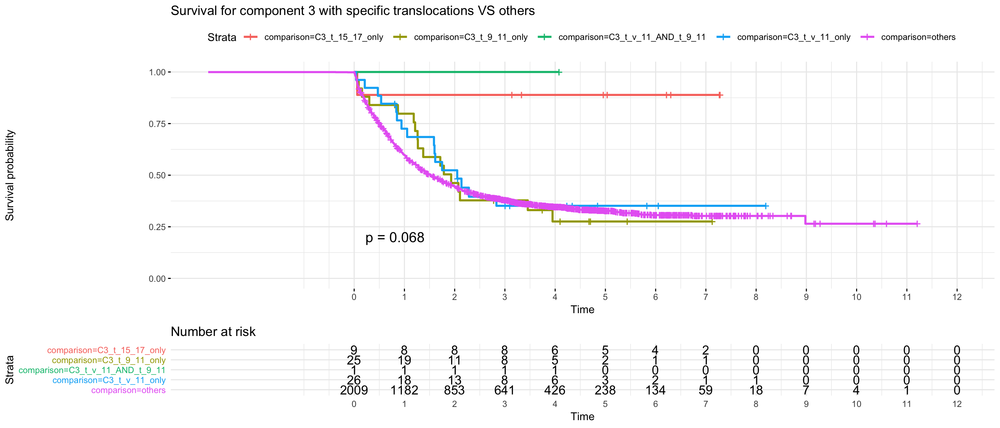

In [33]:
set_notebook_plot_size(14,6)
plot_surv(df_c_3,"Survival for component 3 with specific translocations VS others")

# Component 4

## I-Compare minusy when t_8_21 activated

In [493]:
df_c_4 <- merge(df_w_correlates,df_all_components[c("ASXL2","KIT","minusy","del_9","t_8_21")],by=0)
rownames(df_c_4) <- df_c_4$Row.names
df_c_4 <- df_c_4 [,-1]

[1] "Count : C4_t_8_21_minusy=0 : 47"
[1] "Count : C4_t_8_21_minusy=1 : 27"


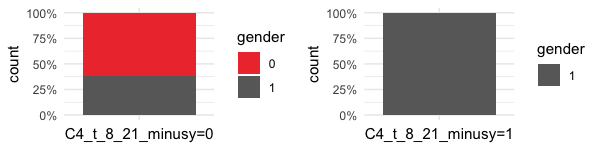

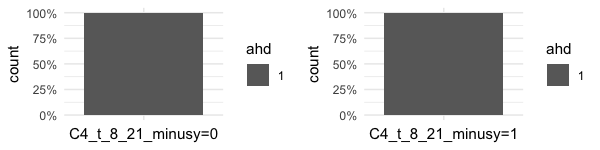

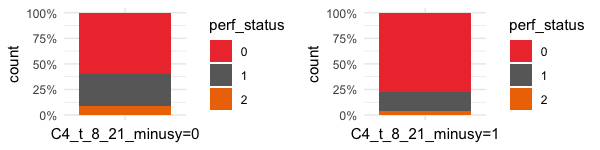

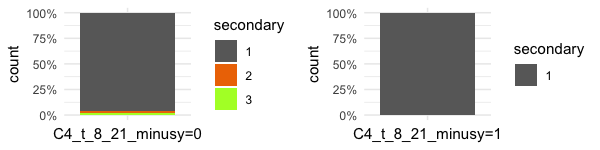

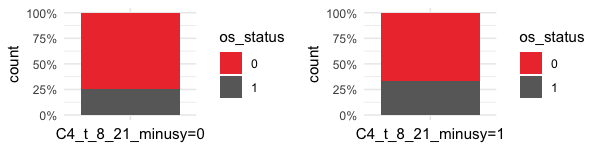

...

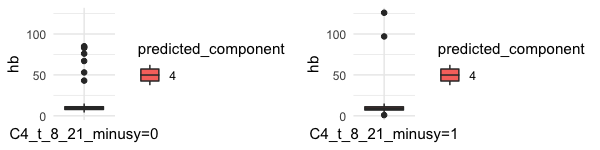

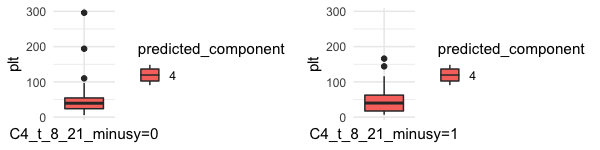

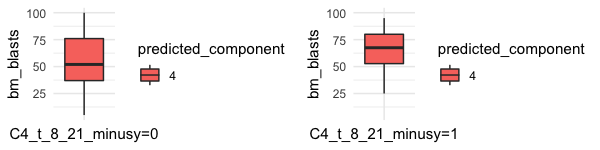

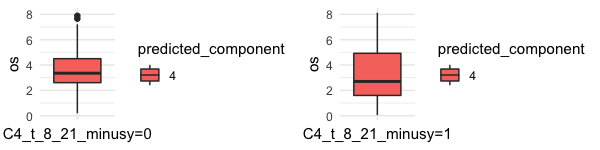

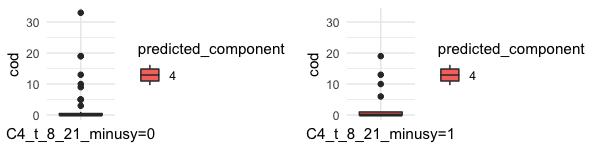

In [494]:
df_c_4$comparison <- ifelse((df_c_4$predicted_component==4)& (df_c_4$minusy==0) & (df_c_4$t_8_21==1), "C4_t_8_21_minusy=0", 
                  ifelse((df_c_4$predicted_component==4)& (df_c_4$minusy==1) & (df_c_4$t_8_21==1), "C4_t_8_21_minusy=1",
                                 "others" ))
plottings(df_c_4[(df_c_4$predicted_component==4)& (df_c_4$minusy==0) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==4)& (df_c_4$minusy==1) & (df_c_4$t_8_21==1),],
          x1="C4_t_8_21_minusy=0",x2="C4_t_8_21_minusy=1",many=2,width=6,height=1.5)

<a id='comp4minusy'></a>

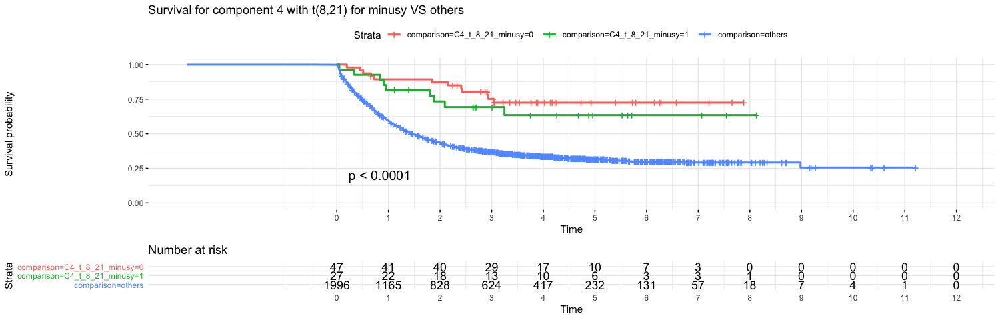

In [502]:
set_notebook_plot_size(15,4.8)
plot_surv(df_c_4,"Survival for component 4 with t(8,21) for minusy VS others")

## II-Compare KIT when t_8_21 activated

In [503]:
df_c_4$comparison <- ifelse((df_c_4$predicted_component==4)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1), "C4_t_8_21_KIT=0", 
                  ifelse((df_c_4$predicted_component==4)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1), "C4_t_8_21_KIT=1",
                                 "others" ))

[1] "Count : C4_t_8_21_KIT=0 : 55"
[1] "Count : C4_t_8_21_KIT=1 : 19"


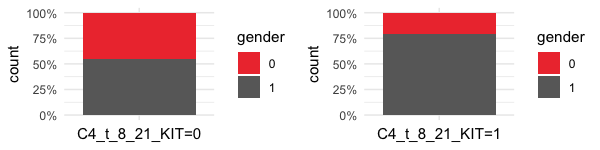

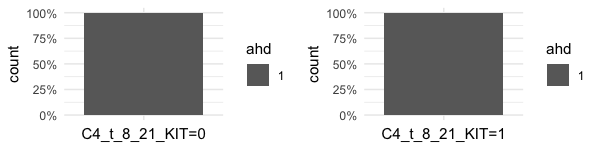

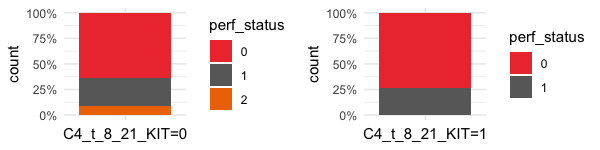

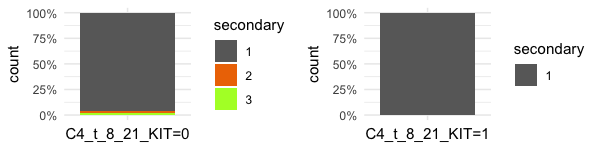

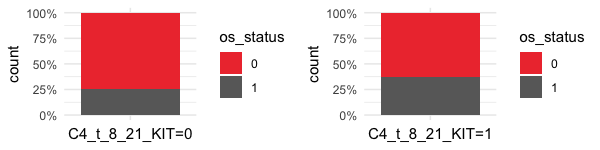

...

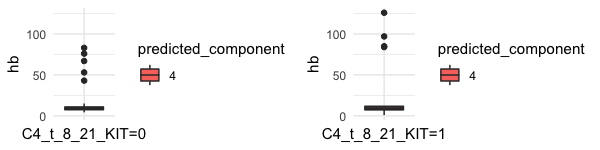

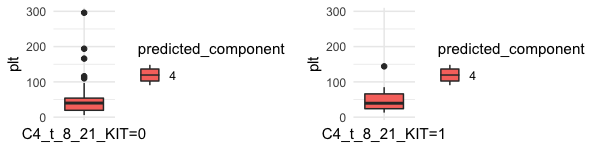

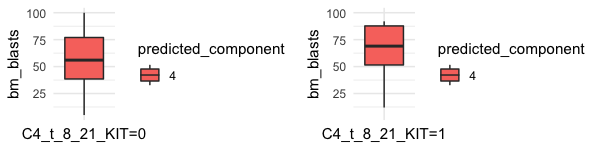

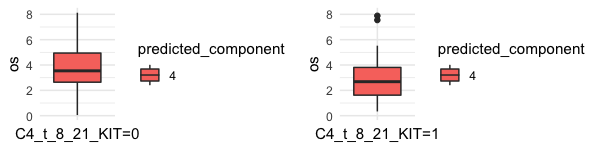

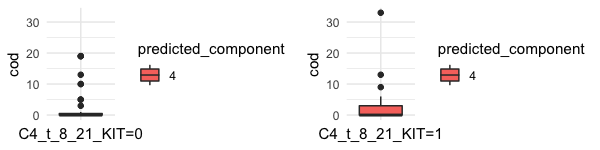

In [504]:
plottings(df_c_4[(df_c_4$predicted_component==4)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==4)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1),],
          x1="C4_t_8_21_KIT=0",x2="C4_t_8_21_KIT=1",many=2,width=6,height=1.5)

<a id='comp4KIT'></a>

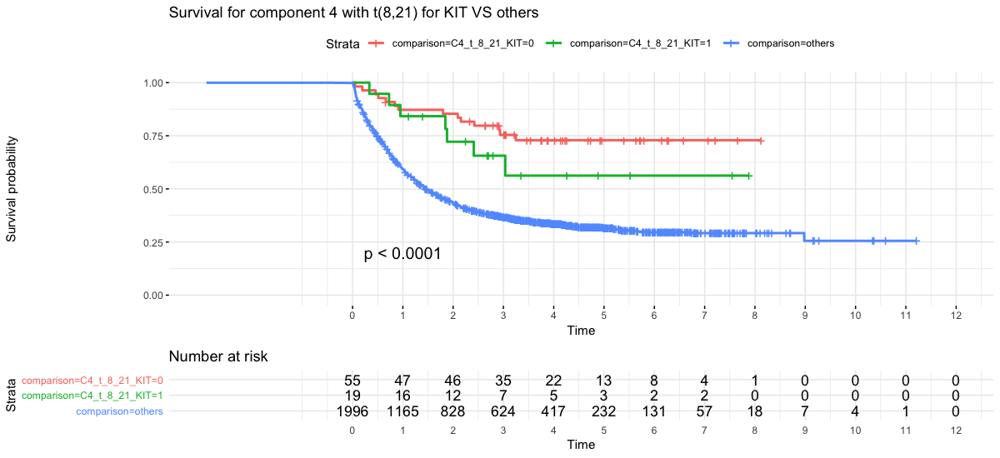

In [505]:
set_notebook_plot_size(12,5.5)
plot_surv(df_c_4,"Survival for component 4 with t(8,21) for KIT VS others")

## III- Analysis with del9 and t_8_21

[1] "Count : C4_t_8_21_AND_del_9=0 : 56"
[1] "Count : C4_t_8_21_AND_del_9=1 : 18"


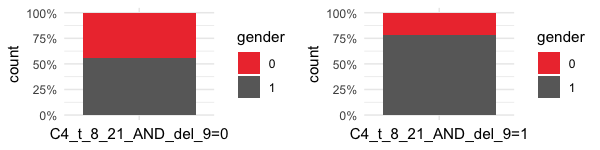

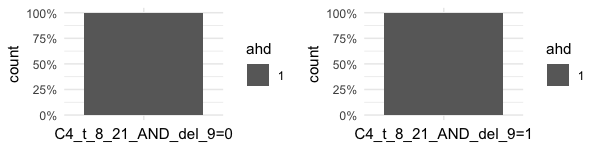

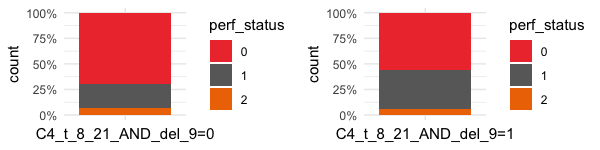

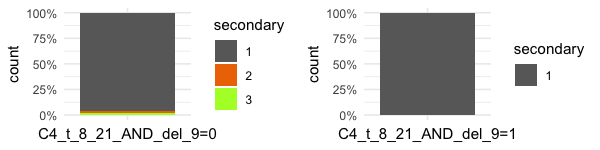

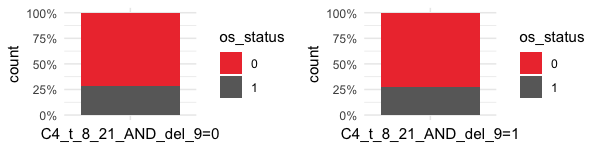

...

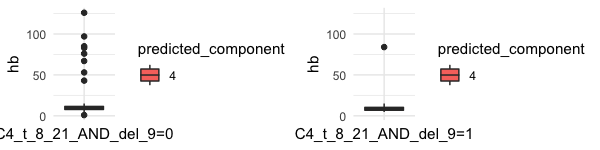

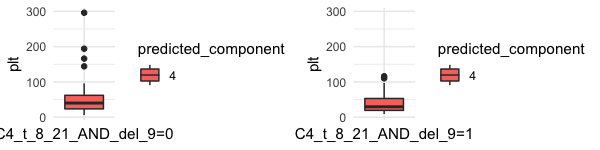

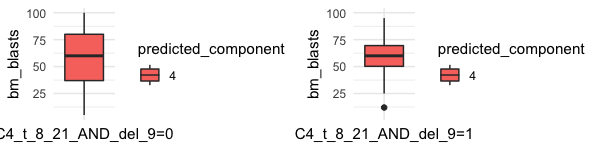

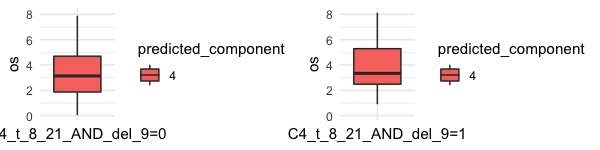

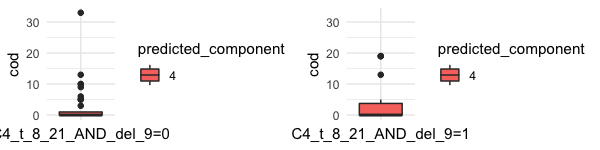

In [506]:
df_c_4$comparison <- ifelse((df_c_4$predicted_component==4)& (df_c_4$del_9==0) & (df_c_4$t_8_21==1), "C4_t_8_21_AND_del_9=0", 
                  ifelse((df_c_4$predicted_component==4)& (df_c_4$del_9==1) & (df_c_4$t_8_21==1), "C4_t_8_21_AND_del_9=1",
                              "others" ))
plottings(df_c_4[(df_c_4$predicted_component==4)& (df_c_4$del_9==0) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==4)& (df_c_4$del_9==1) & (df_c_4$t_8_21==1),],
          x1="C4_t_8_21_AND_del_9=0",x2="C4_t_8_21_AND_del_9=1",many=2,width=6,height=1.5)

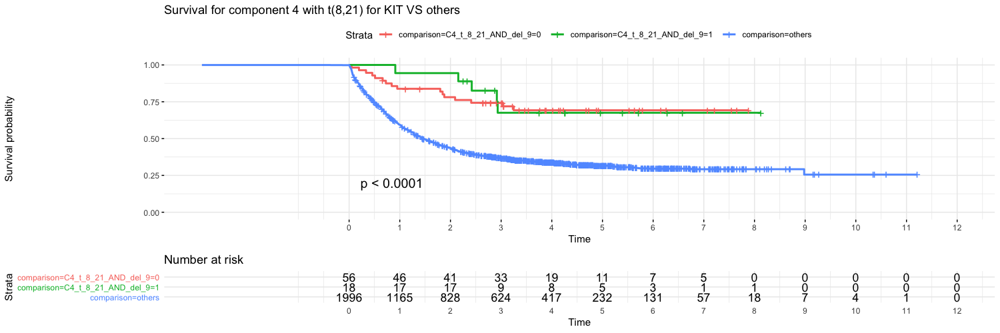

In [507]:
set_notebook_plot_size(15,5)
plot_surv(df_c_4,"Survival for component 4 with t(8,21) for KIT VS others")

# Component 4 compared with 5 on KIT when t(8,21) activated

[1] "Count : C4_t_8_21_KIT=0 : 55"
[1] "Count : C4_t_8_21_KIT=1 : 19"
[1] "Count : C5_t_8_21_KIT=0 : 15"
[1] "Count : C5_t_8_21_KIT=1 : 9"


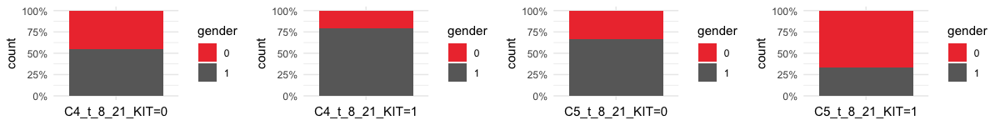

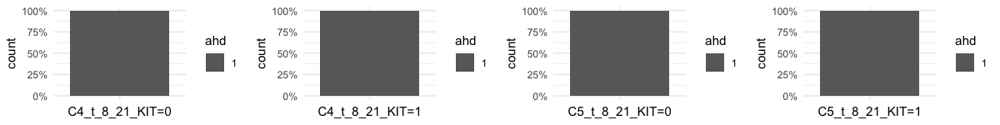

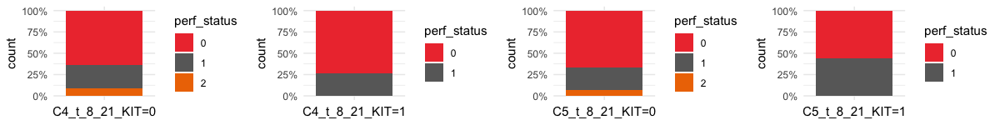

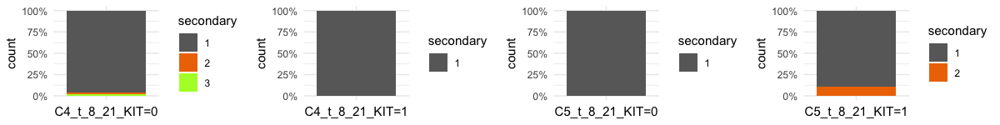

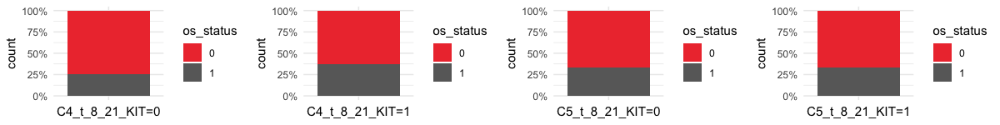

...

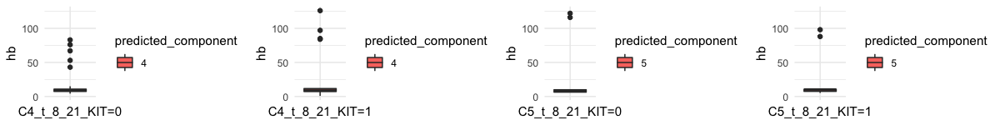

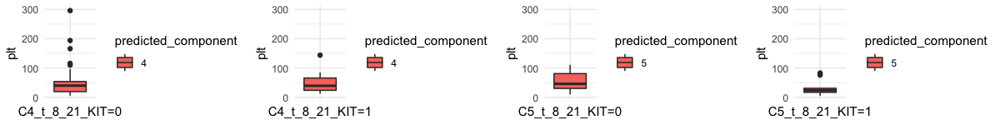

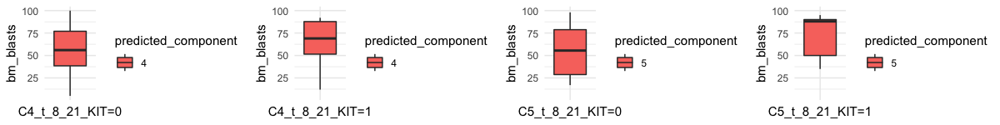

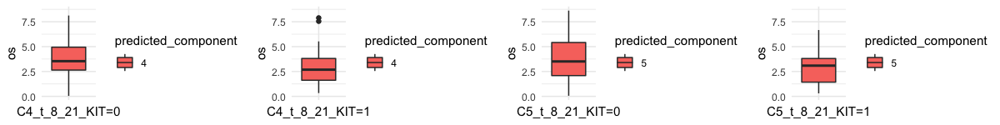

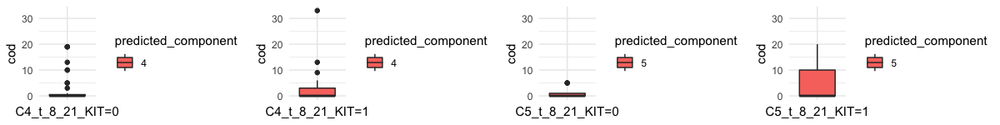

In [518]:
plottings(df_c_4[(df_c_4$predicted_component==4)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==4)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==5)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1),],
          df_c_4[(df_c_4$predicted_component==5)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1),],
          x1="C4_t_8_21_KIT=0",x2="C4_t_8_21_KIT=1",x3="C5_t_8_21_KIT=0",x4="C5_t_8_21_KIT=1",many=4,width=12,height=1.5)

<a id='comp4-5'></a>

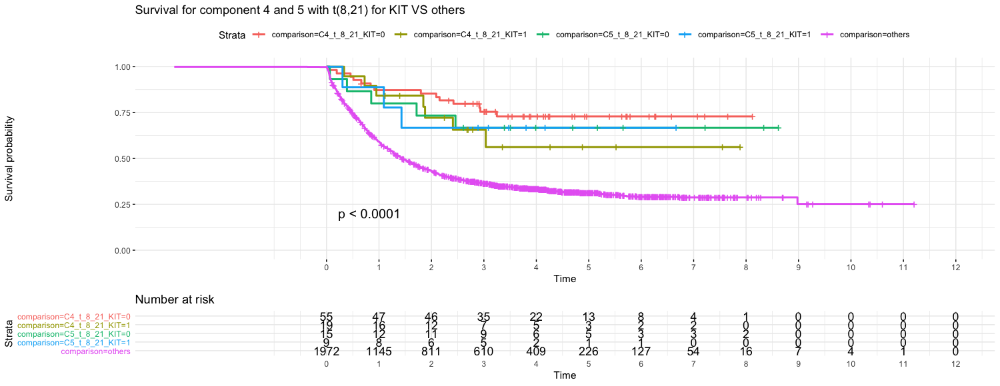

In [520]:
df_c_4$comparison <- ifelse((df_c_4$predicted_component==4)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1), "C4_t_8_21_KIT=0", 
                     ifelse((df_c_4$predicted_component==4)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1), "C4_t_8_21_KIT=1",
                     ifelse((df_c_4$predicted_component==5)& (df_c_4$KIT==0) & (df_c_4$t_8_21==1), "C5_t_8_21_KIT=0", 
                     ifelse((df_c_4$predicted_component==5)& (df_c_4$KIT==1) & (df_c_4$t_8_21==1), "C5_t_8_21_KIT=1",      
                                 "others" ))))
set_notebook_plot_size(15,5.8)
plot_surv(df_c_4,"Survival for component 4 and 5 with t(8,21) for KIT VS others")

# All components KIT and t(8,21)

<a id='t_8_21'></a>

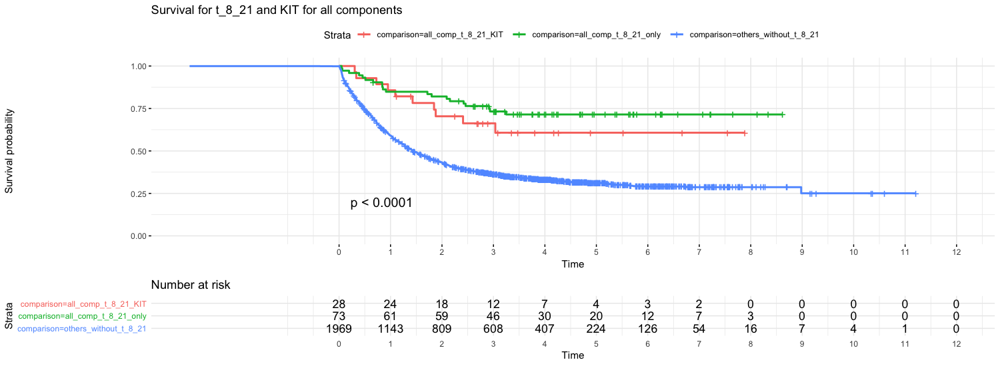

In [517]:
set_notebook_plot_size(15,5.5)
tmp <- merge(df_w_correlates,df_all_components[c("t_8_21","KIT")],by=0)
rownames(tmp) <- tmp$Row.names
tmp <- tmp [,-1]
tmp$comparison <- ifelse((tmp$t_8_21==1) & (tmp$KIT==1)  ,"all_comp_t_8_21_KIT",
                  ifelse((tmp$t_8_21==1) & (tmp$KIT==0),"all_comp_t_8_21_only","others_without_t_8_21"))
plot_surv(tmp,"Survival for t_8_21 and KIT for all components")

# Component 5

In [512]:
df_c_5 <- merge(df_w_correlates,df_all_components[c("KIT","minusy","t_8_21","NRAS_p.G12_13","NRAS_p.Q61_62")],by=0)
rownames(df_c_5) <- df_c_5$Row.names
df_c_5 <- df_c_5 [,-1]
df_c_5$comparison <- ifelse((df_c_5$predicted_component==5) & (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1), "C5_t_8_21=1_AND_NRAS=1", 
                     ifelse((df_c_5$predicted_component==5) & (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==0) & (df_c_5$NRAS_p.G12_13==0), "C5_t_8_21=1_AND_NRAS=0",
                     ifelse((df_c_5$predicted_component==5) & (df_c_5$t_8_21==0) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1), "C5_T_8_21=0_AND_NRAS=1", 
                     ifelse((df_c_5$predicted_component==5) & (df_c_5$t_8_21==0) &(df_c_5$NRAS_p.Q61_62==0) & (df_c_5$NRAS_p.G12_13==0), "C5_t_8_21=0_AND_NRAS=0",
                                 "others" ))))

[1] "Count : C5_t_8_21=1_AND_NRAS=1 : 14"
[1] "Count : C5_t_8_21=1_AND_NRAS=0 : 10"
[1] "Count : C5_T_8_21=0_AND_NRAS=1 : 20"
[1] "Count : C5_t_8_21=0_AND_NRAS=0 : 18"


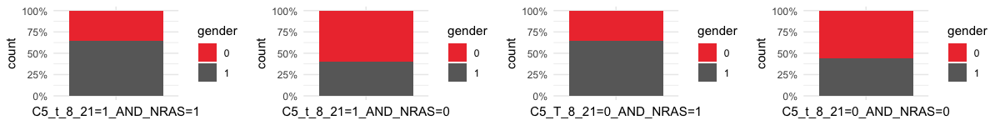

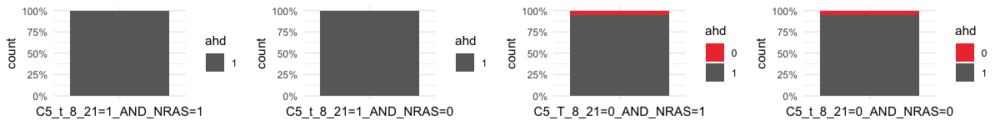

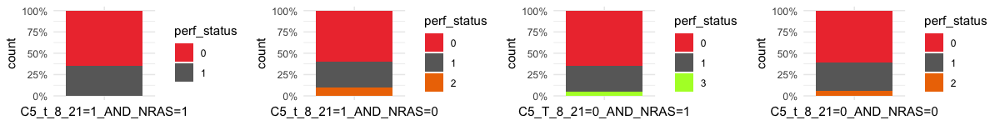

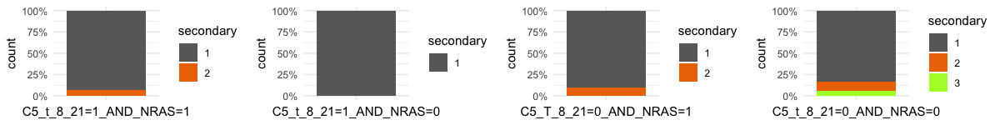

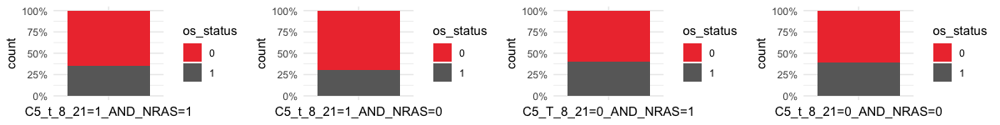

...

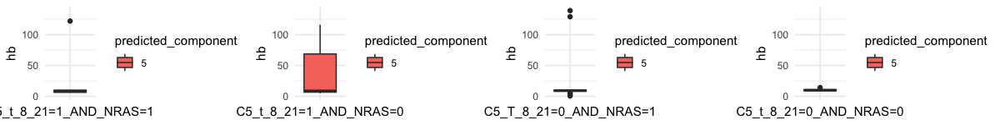

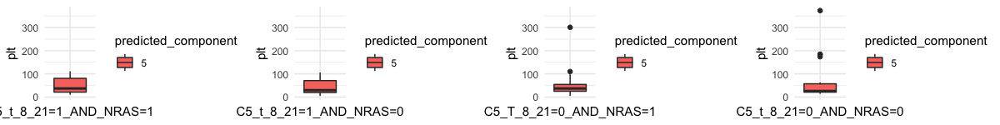

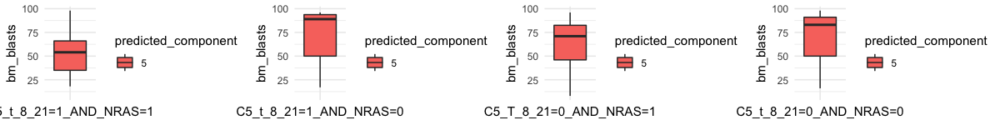

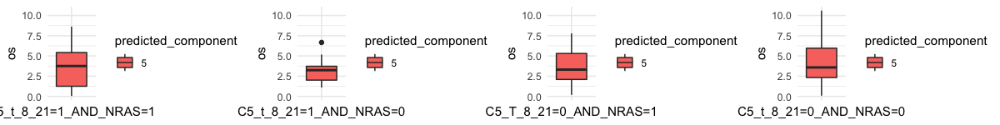

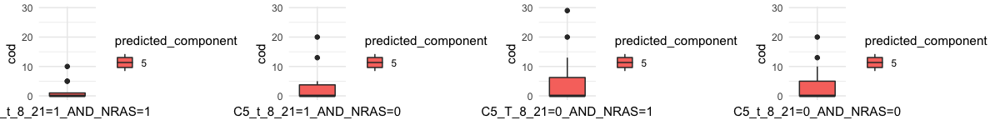

In [514]:
plottings(df_c_5[(df_c_5$predicted_component==5) & (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1),],
          df_c_5[(df_c_5$predicted_component==5) & (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==0) & (df_c_5$NRAS_p.G12_13==0),],
          df_c_5[(df_c_5$predicted_component==5) & (df_c_5$t_8_21==0) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1),],
          df_c_5[(df_c_5$predicted_component==5) & (df_c_5$t_8_21==0) &(df_c_5$NRAS_p.Q61_62==0) & (df_c_5$NRAS_p.G12_13==0),],
          x1="C5_t_8_21=1_AND_NRAS=1",x2="C5_t_8_21=1_AND_NRAS=0",x3="C5_T_8_21=0_AND_NRAS=1",x4="C5_t_8_21=0_AND_NRAS=0",many=4,width=12,height=1.5)

<a id='comp5'></a>

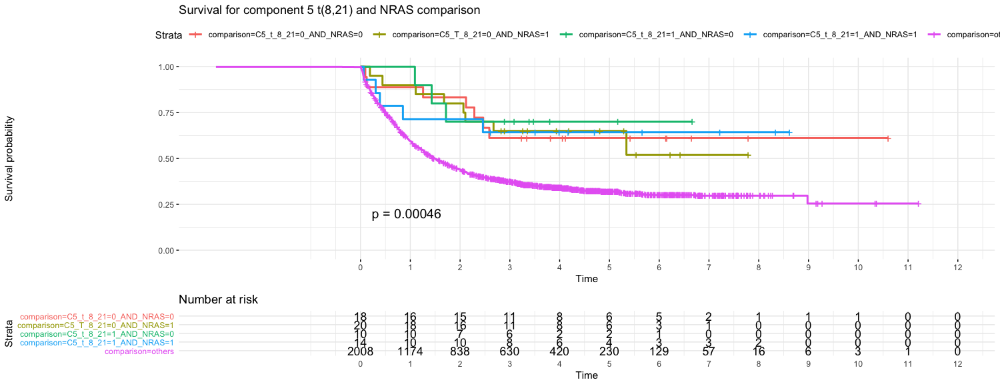

In [516]:
set_notebook_plot_size(15,5.8)
plot_surv(df_c_5,"Survival for component 5 t(8,21) and NRAS comparison")

<a id='NRAS'></a>

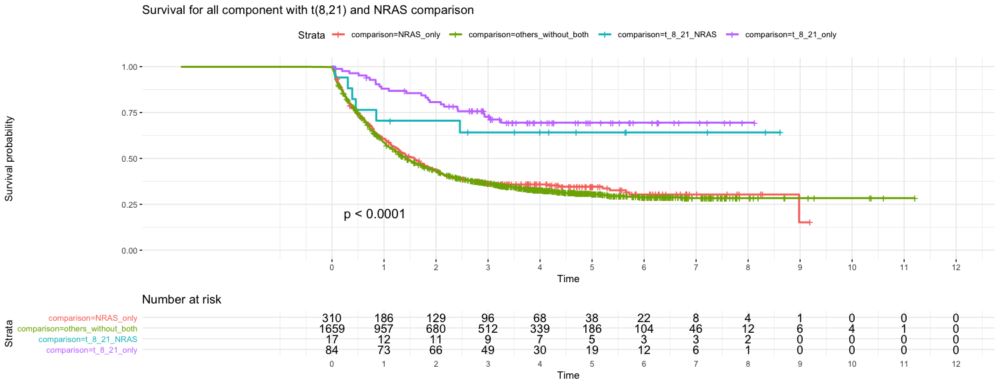

In [527]:
tmp <- df_c_5
tmp$comparison <- ifelse( (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1), "t_8_21_NRAS", 
                     ifelse( (df_c_5$t_8_21==1) &(df_c_5$NRAS_p.Q61_62==0) & (df_c_5$NRAS_p.G12_13==0), "t_8_21_only",
                     ifelse( (df_c_5$t_8_21==0) &(df_c_5$NRAS_p.Q61_62==1 | df_c_5$NRAS_p.G12_13==1), "NRAS_only",
                                 "others_without_both" )))
plot_surv(tmp,"Survival for all component with t(8,21) and NRAS comparison")

# Component 6

In [531]:
df_c_6 <- merge(df_w_correlates,df_all_components[c("CEBPA_bi","GATA2","KIT")],by=0)
rownames(df_c_6) <- df_c_6$Row.names
df_c_6 <- df_c_6 [,-1]

In [540]:
dim(df_c_6[(df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==1) & (df_c_6$GATA2==0),])

[1] 18 18

[1] "Count : C6_CEBPAbi_GATA2 : 17"
[1] "Count : C6_CEBPAbi_only : 18"
[1] "Count : C6_GATA2_only : 10"
[1] "Count : C6_others : 3"


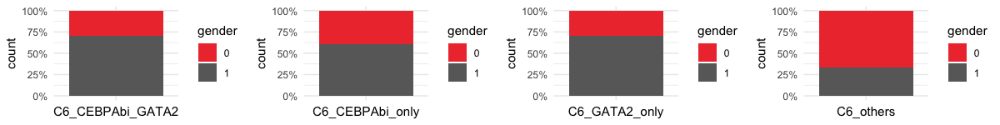

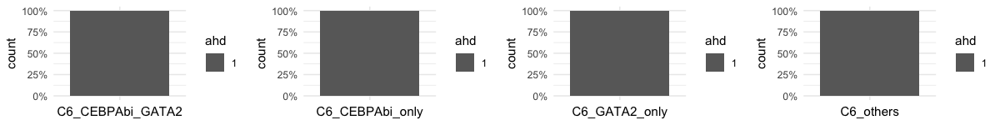

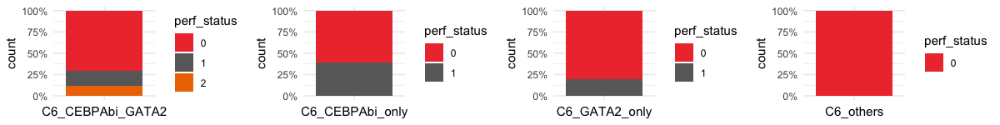

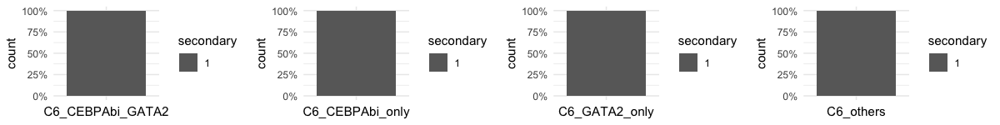

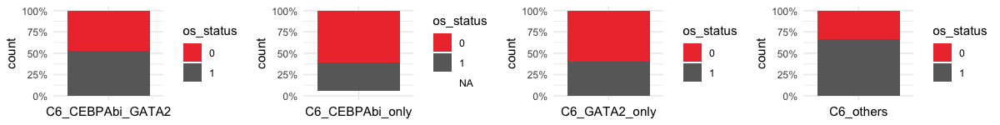

...

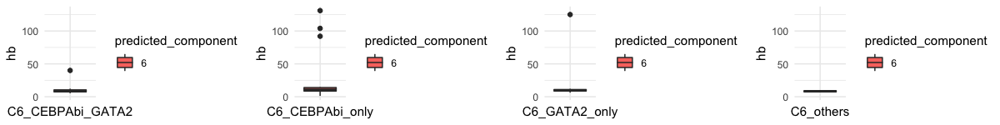

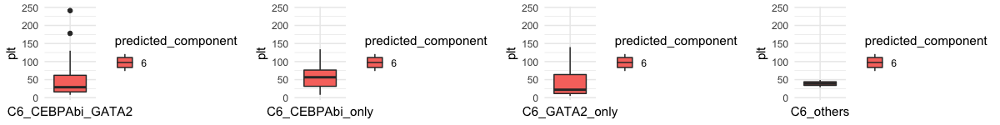

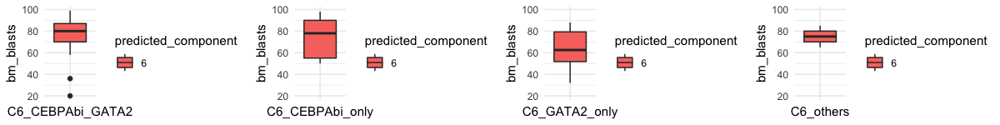

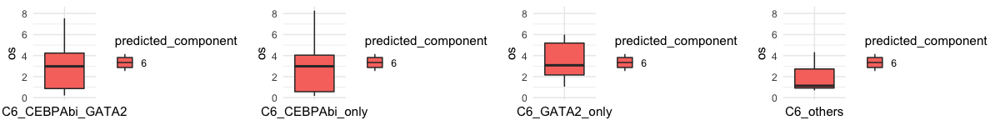

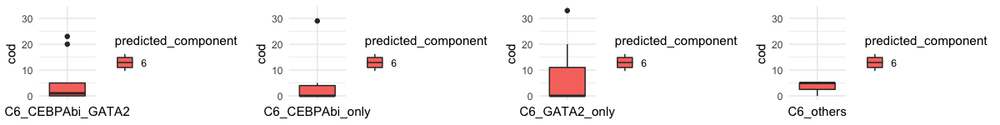

In [542]:
df_c_6$comparison <- ifelse((df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==1) & (df_c_6$GATA2==1), "C6_CEBPAbi_GATA2",
                     ifelse((df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==1) & (df_c_6$GATA2==0),"C6_CEBPAbi_only",
                     ifelse((df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==0) & (df_c_6$GATA2==1),"C6_GATA2_only",
                     ifelse((df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==0) & (df_c_6$GATA2==0),"C6_others","others" ))))
plottings(df_c_6[(df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==1) & (df_c_6$GATA2==1),],
          df_c_6[(df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==1) & (df_c_6$GATA2==0),],
          df_c_6[(df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==0) & (df_c_6$GATA2==1),],
          df_c_6[(df_c_6$predicted_component==6) & (df_c_6$CEBPA_bi==0) & (df_c_6$GATA2==0),],
          x1="C6_CEBPAbi_GATA2",x2="C6_CEBPAbi_only",x3="C6_GATA2_only",x4="C6_others",many=4,width=12,height=1.5)

<a id='comp6'></a>

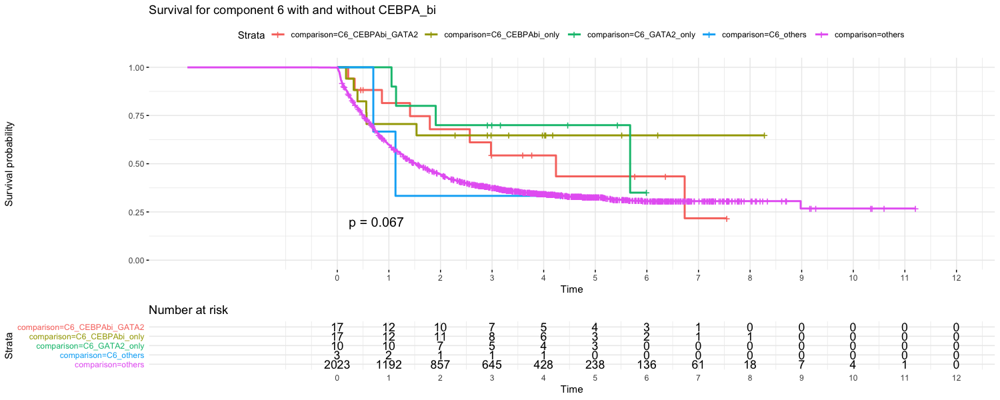

In [543]:
set_notebook_plot_size(15,6)
plot_surv(df_c_6,"Survival for component 6 with and without CEBPA_bi ")

# Component 7

## I- SF3B1,inv3 and del7 

In [546]:
df_c_7 <- merge(df_w_correlates,df_all_components[c("SF3B1","inv_3","del_7")],by=0)
rownames(df_c_7) <- df_c_7$Row.names
df_c_7 <- df_c_7 [,-1]

[1] "Count : C7_SF3B1=1_inv3=1_del7=1 : 3"
[1] "Count : others_C7 : 24"


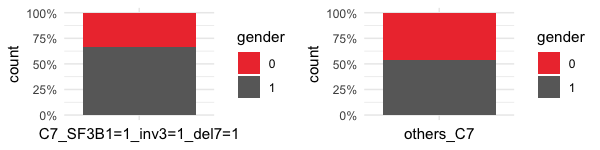

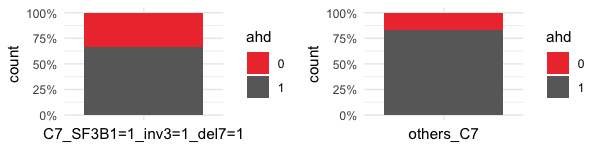

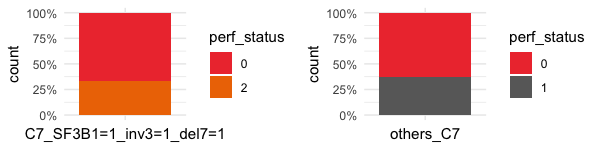

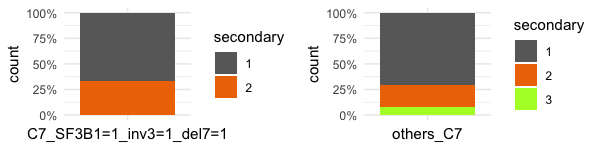

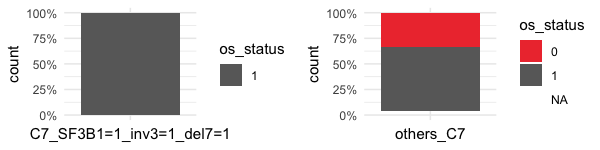

...

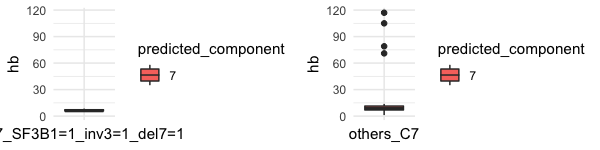

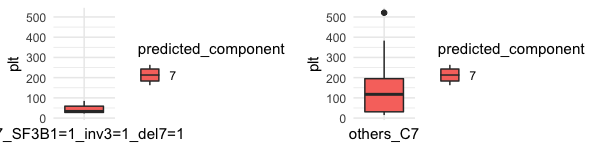

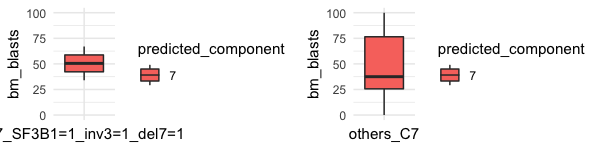

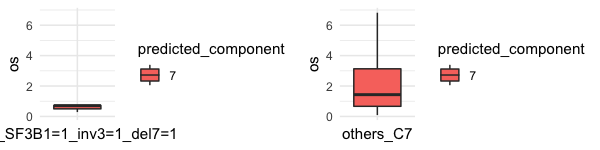

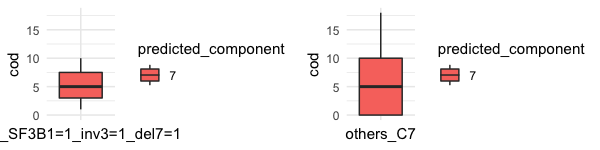

In [547]:
df_c_7$comparison <- ifelse((df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==1) & (df_c_7$del_7==1), "C7_SF3B1,inv3,del7",
                            ifelse((df_c_7$predicted_component==7) & !((df_c_7$SF3B1==1) & (df_c_7$inv_3==1) & (df_c_7$del_7==1)),"C7_others","others" ))
plottings(df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==1) & (df_c_7$del_7==1),],
          df_c_7[(df_c_7$predicted_component==7) & !((df_c_7$SF3B1==1) & (df_c_7$inv_3==1) & (df_c_7$del_7==1)),],
          x1="C7_SF3B1=1_inv3=1_del7=1",x2="others_C7",many=2,width=6,height=1.5)


<a id='comp7'></a>

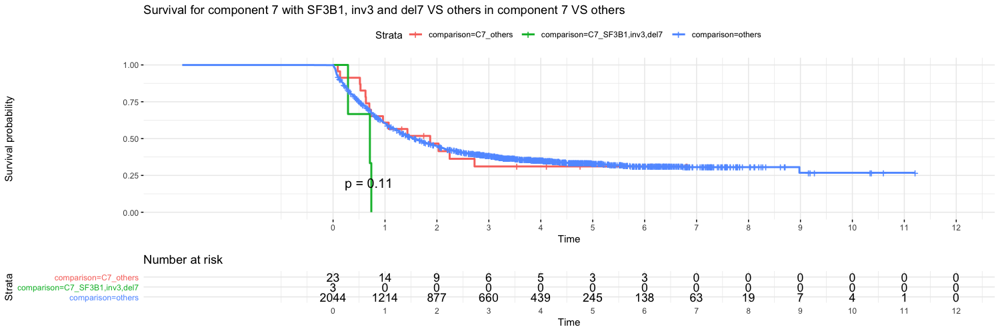

In [549]:
set_notebook_plot_size(15,5)
plot_surv(df_c_7,"Survival for component 7 with SF3B1, inv3 and del7 VS others in component 7 VS others")

## II- SF3B1,inv3 

[1] "Count : C7_SF3B1_inv3 : 6"
[1] "Count : C7_SF3B1_no_inv3 : 8"
[1] "Count : C7_inv3_no_SF3B1 : 2"


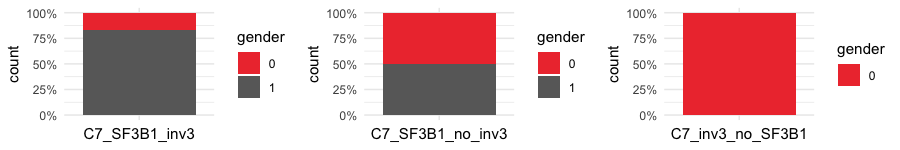

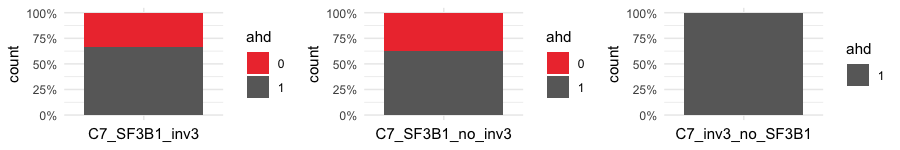

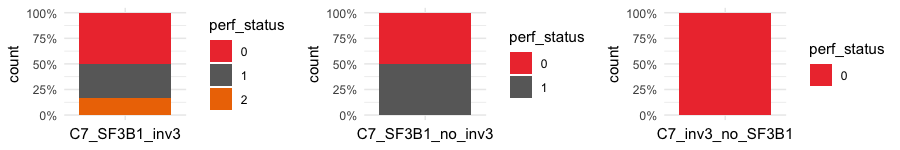

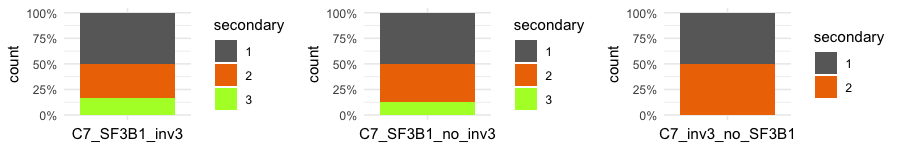

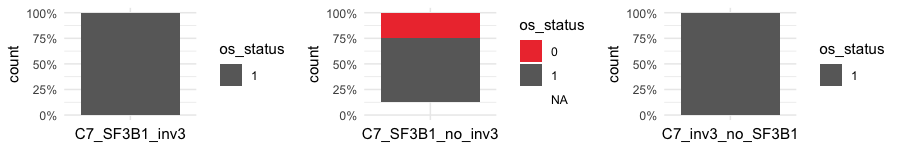

...

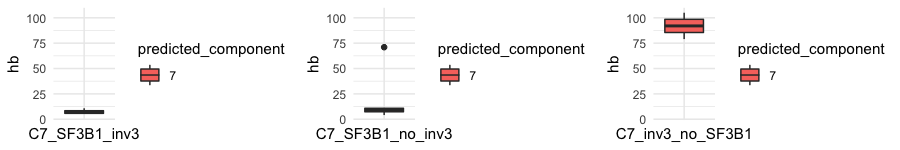

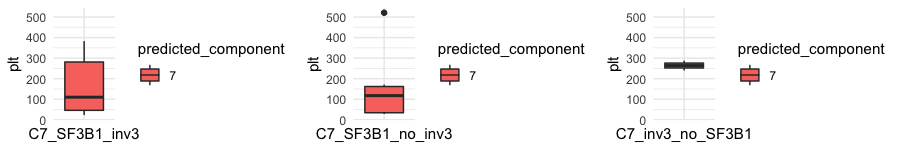

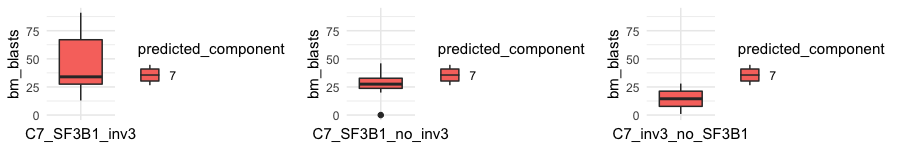

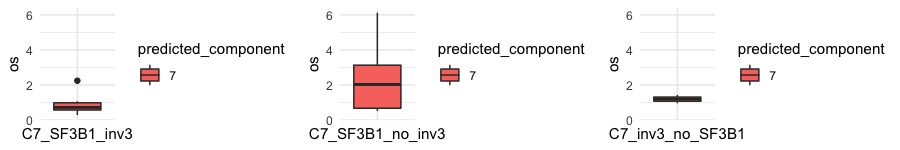

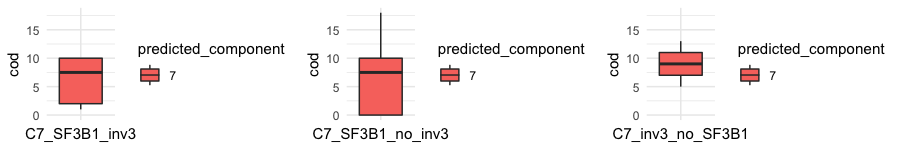

In [562]:
df_c_7$comparison <- ifelse((df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==1) , "C7_SF3B1_inv3",
                            ifelse((df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==0),"C7_SF3B1_no_inv3",
                            ifelse((df_c_7$predicted_component==7)  & (df_c_7$SF3B1==0) & (df_c_7$inv_3==1),"C7_inv3_no_SF3B1","others" )))
plottings(df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==1),],
          df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$inv_3==0),],
          df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==0) & (df_c_7$inv_3==1),],
          x1="C7_SF3B1_inv3",x2="C7_SF3B1_no_inv3",x3="C7_inv3_no_SF3B1",many=3,width=9,height=1.5)


<a id='comp7_bis'></a>

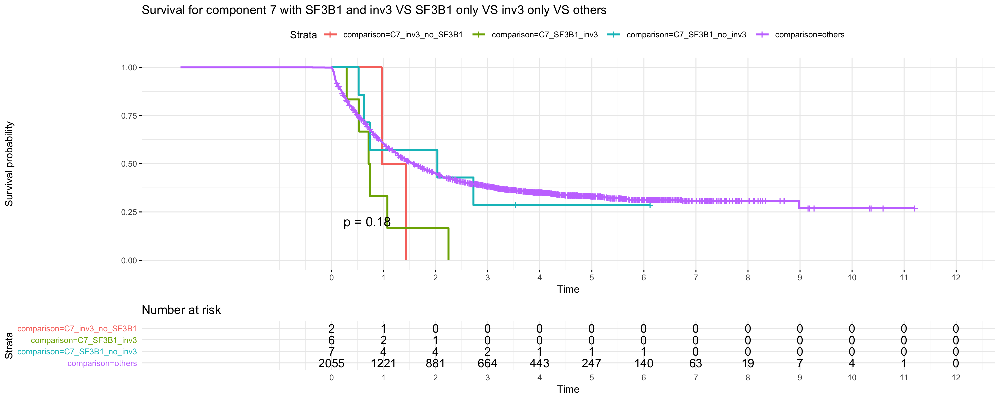

In [62]:
set_notebook_plot_size(15,6)
plot_surv(df_c_7,"Survival for component 7 with SF3B1 and inv3 VS SF3B1 only VS inv3 only VS others")

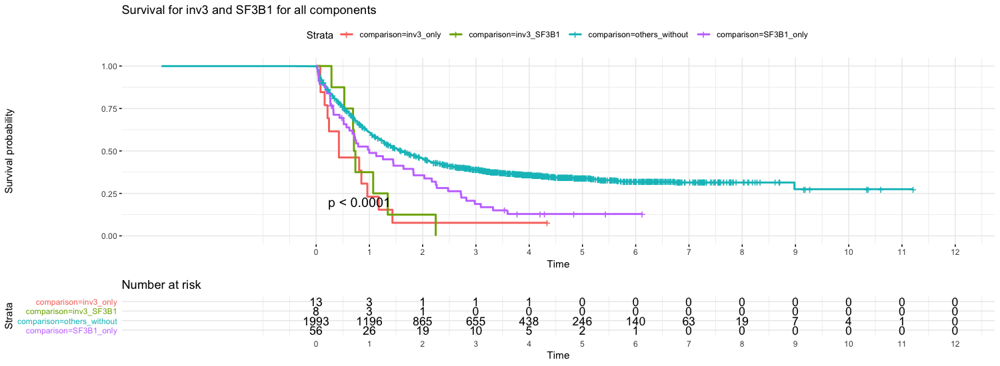

In [565]:
set_notebook_plot_size(15,5.5)
df_c_7$comparison <- ifelse((df_c_7$inv_3==1) & (df_c_7$SF3B1==1), "inv3_SF3B1",
                     ifelse((df_c_7$inv_3==1) & (df_c_7$SF3B1==0),"inv3_only",
                     ifelse((df_c_7$inv_3==0) & (df_c_7$SF3B1==1), "SF3B1_only","others_without")))
plot_surv(df_c_7, "Survival for inv3 and SF3B1 for all components")

## III- SF3B1,del7

[1] "Count : C7_SF3B1_del7 : 6"
[1] "Count : C7_SF3B1_no_del7 : 8"
[1] "Count : C7_del7_no_SF3B1 : 4"


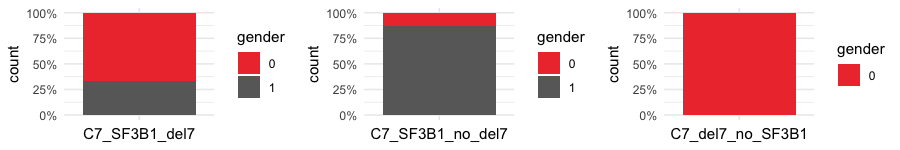

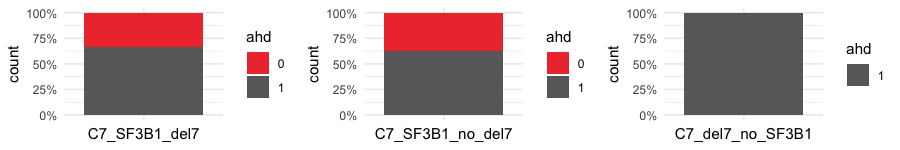

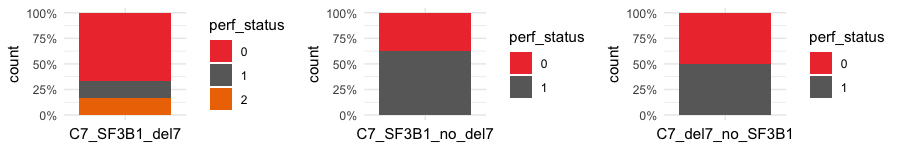

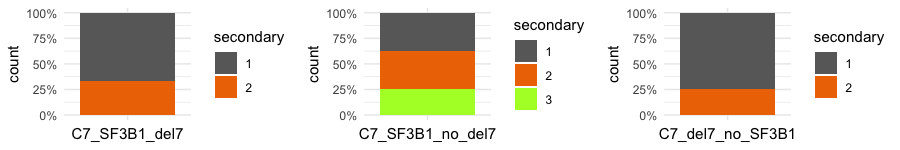

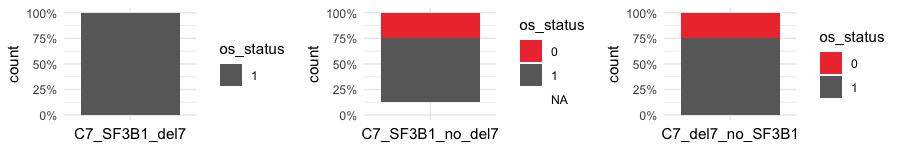

...

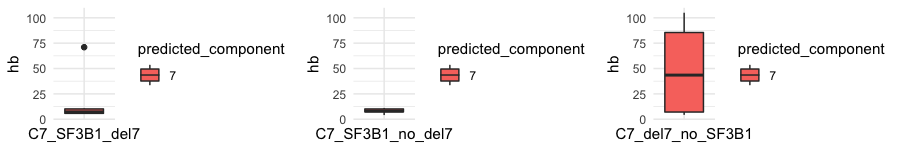

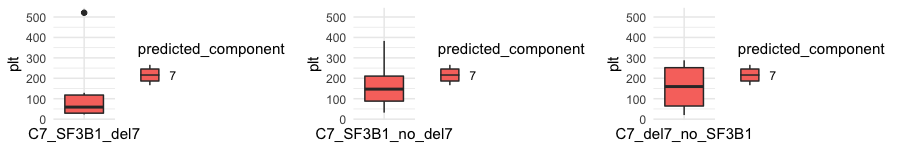

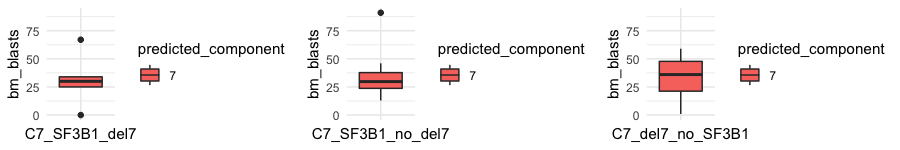

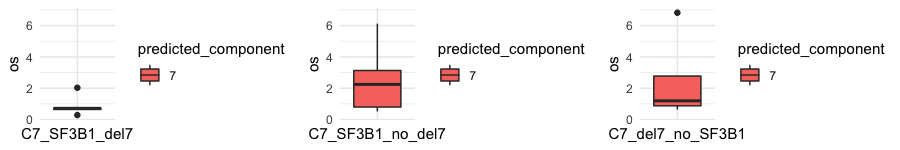

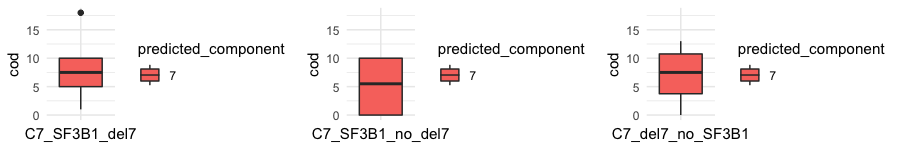

In [576]:
df_c_7$comparison <- ifelse((df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$del_7==1) , "C7_SF3B1_del7",
                            ifelse((df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$del_7==0),"C7_SF3B1_no_del7",
                            ifelse((df_c_7$predicted_component==7)  & (df_c_7$SF3B1==0) & (df_c_7$del_7==1),"C7_del7_no_SF3B1","others" )))
plottings(df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$del_7==1),],
          df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==1) & (df_c_7$del_7==0),],
          df_c_7[(df_c_7$predicted_component==7) & (df_c_7$SF3B1==0) & (df_c_7$del_7==1),],
          x1="C7_SF3B1_del7",x2="C7_SF3B1_no_del7",x3="C7_del7_no_SF3B1",many=3,width=9,height=1.5)


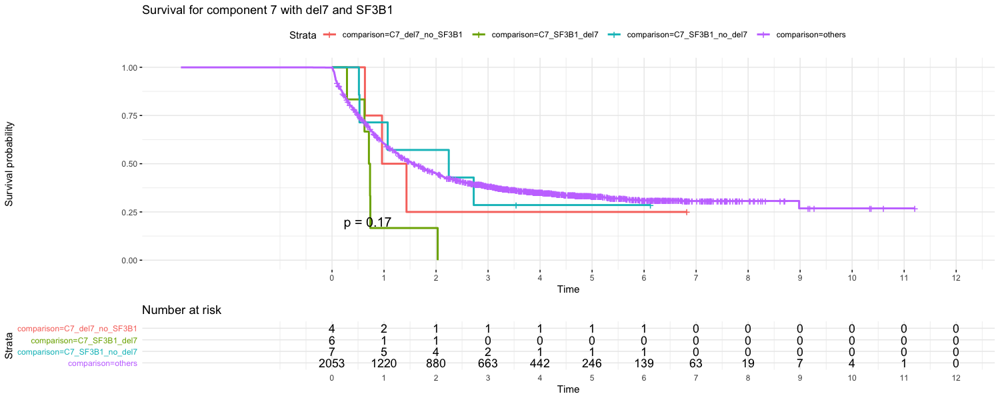

In [577]:
set_notebook_plot_size(15,6)
plot_surv(df_c_7,"Survival for component 7 with del7 and SF3B1")

# Component 8

In [587]:
df_c_8 <- merge(df_w_correlates,df_all_components[c("BAGE3","KMT2C")],by=0)
rownames(df_c_8) <- df_c_8$Row.names
df_c_8 <- df_c_8 [,-1]

[1] "Count : C8_BAGE3_KMT2C : 8"
[1] "Count : others : 2086"


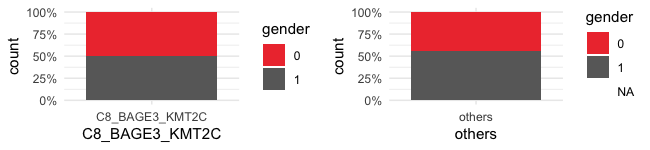

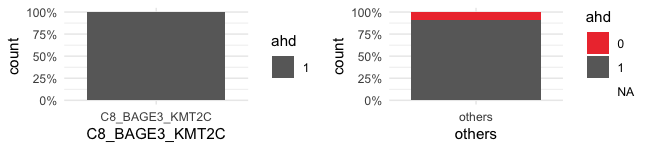

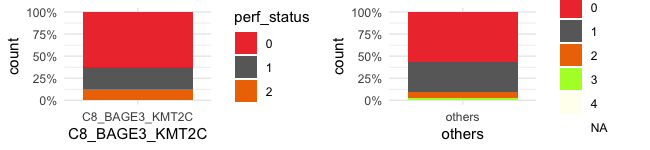

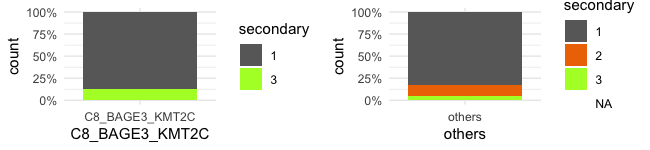

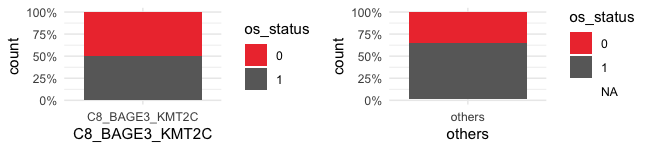

...

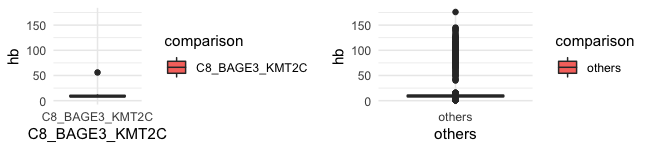

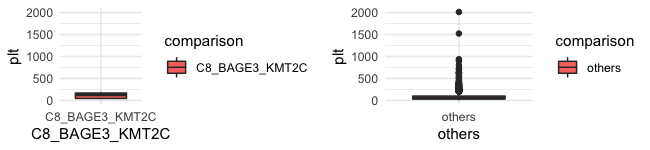

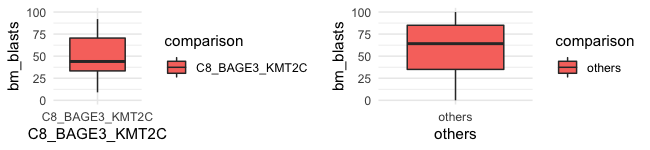

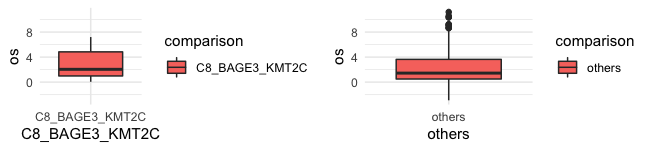

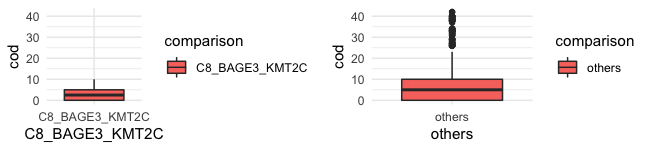

In [140]:
df_c_8$comparison <- ifelse((df_c_8$predicted_component==8) & (df_c_8$BAGE3==1) & (df_c_8$KMT2C==1) , "C8_BAGE3_KMT2C","others" )
plottings_comparison(df_c_8[df_c_8$comparison=="C8_BAGE3_KMT2C",],df_c_8[(df_c_8$comparison=="others"),],x1="C8_BAGE3_KMT2C",x2="others",many=2,width=6.5,height=1.5)
#set_notebook_plot_size(6.5,1.5)

<a id='comp8'></a>

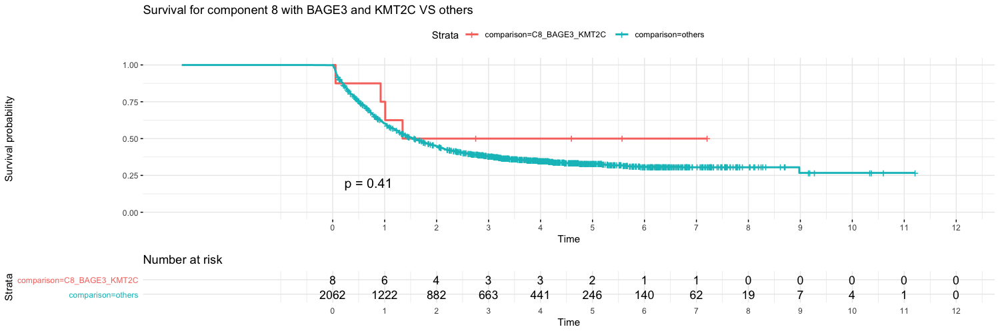

In [77]:
set_notebook_plot_size(15,5)
plot_surv(df_c_8,"Survival for component 8 with BAGE3 and KMT2C VS others")

# New Component 1 AND 2 comparison

In [596]:
df_c_9 <- merge(df_w_correlates,df_all_components[c("SRSF2","RUNX1","STAG2","U2AF1","MLL","TET2","NF1","SETBP1")],by=0)
rownames(df_c_9) <- df_c_9$Row.names
df_c_9 <- df_c_9 [,-1]

[1] "Count : NC1_SRSF2_RUNX1_STAG2 : 25"
[1] "Count : NC2_U2AF1_MLL : 25"
[1] "Count : NC1_others : 279"
[1] "Count : NC2_others : 145"


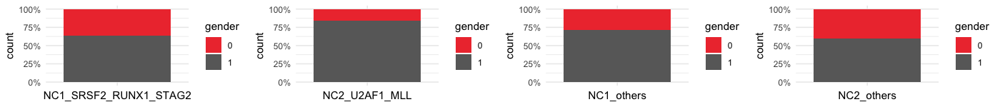

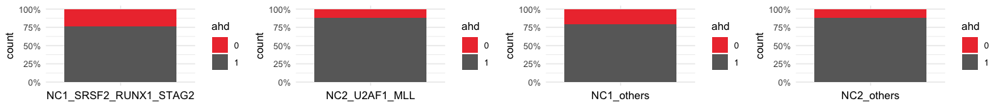

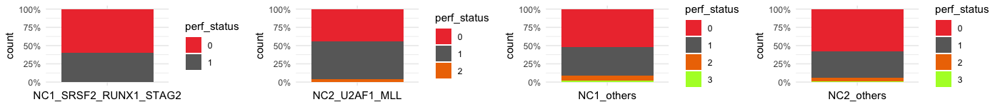

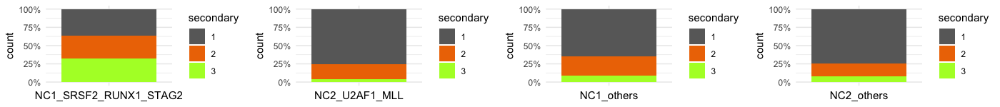

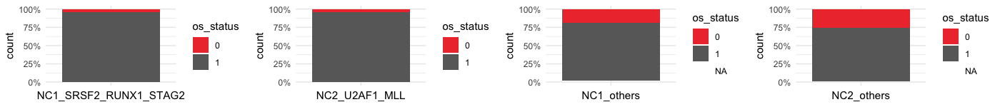

...

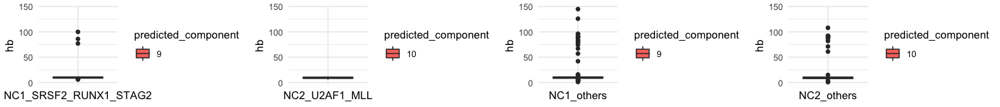

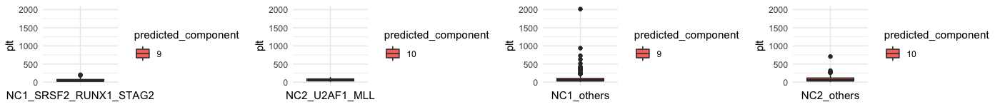

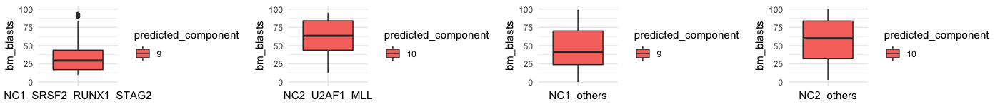

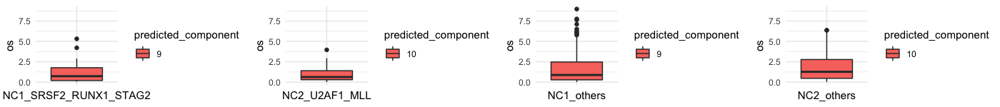

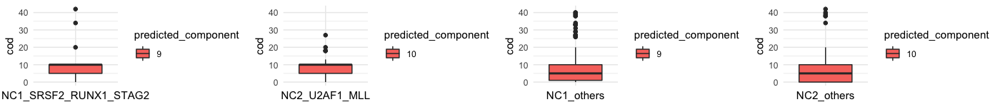

In [599]:
df_c_9$comparison <- ifelse((df_c_9$predicted_component==9) & (df_c_9$SRSF2==1) & (df_c_9$RUNX1==1) &(df_c_9$STAG2==1) , "NC1_SRSF2_RUNX1_STAG2",
                            ifelse((df_c_9$predicted_component==10) & (df_c_9$U2AF1==1) & (df_c_9$MLL==1),"NC2_U2AF1_MLL", 
                            ifelse((df_c_9$predicted_component==9)  & !((df_c_9$SRSF2==1) & (df_c_9$RUNX1==1) &(df_c_9$STAG2==1)),"NC1_others",
                            ifelse((df_c_9$predicted_component==10)  & !((df_c_9$U2AF1==1) & (df_c_9$MLL==1)),"NC2_others",
                                   "others" ))))
plottings(df_c_9[(df_c_9$predicted_component==9) & (df_c_9$SRSF2==1) & (df_c_9$RUNX1==1) &(df_c_9$STAG2==1),],
          df_c_9[(df_c_9$predicted_component==10) & (df_c_9$U2AF1==1) & (df_c_9$MLL==1),],
          df_c_9[(df_c_9$predicted_component==9)  & !((df_c_9$SRSF2==1) & (df_c_9$RUNX1==1) &(df_c_9$STAG2==1)),],
          df_c_9[(df_c_9$predicted_component==10)  & !((df_c_9$U2AF1==1) & (df_c_9$MLL==1)),],       
          x1="NC1_SRSF2_RUNX1_STAG2",x2="NC2_U2AF1_MLL",x3="NC1_others",x4="NC2_others",many=4,width=14,height=1.5)

<a id='nc1-2'></a>

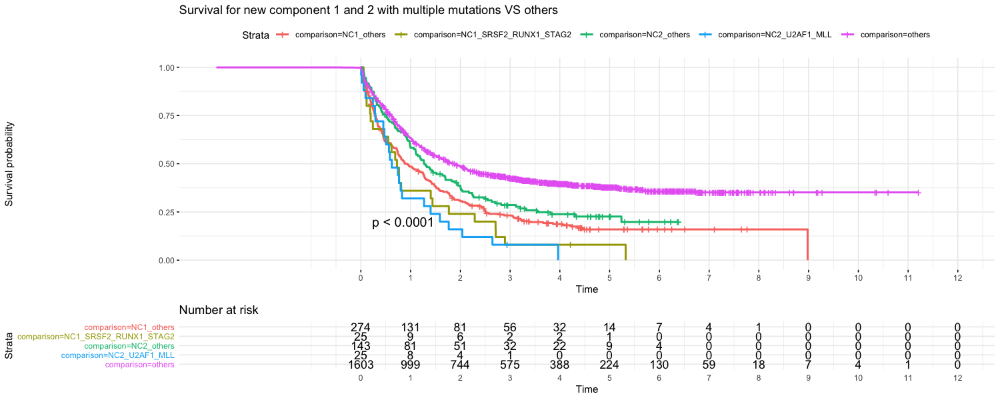

In [129]:
set_notebook_plot_size(15,6)
plot_surv(df_c_9,"Survival for new component 1 and 2 with multiple mutations VS others")

# Component 2 when DNMT3A and ITD mutation

In [606]:
df_c_10 <- merge(df_w_correlates,df_all_components[c("DNMT3A","ITD")],by=0)
rownames(df_c_10) <- df_c_10$Row.names
df_c_10 <- df_c_10 [,-1]

[1] "Count : NC2_DNMT3A_ITD : 30"
[1] "Count : others_DNMT3A_ITD : 172"
[1] "Count : NC2_without : 140"
[1] "Count : others_without : 1752"


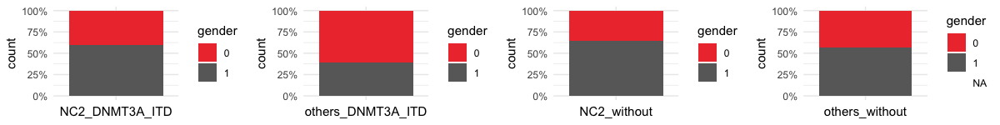

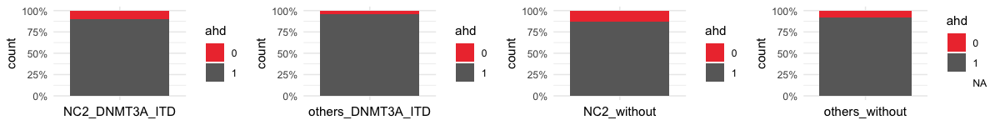

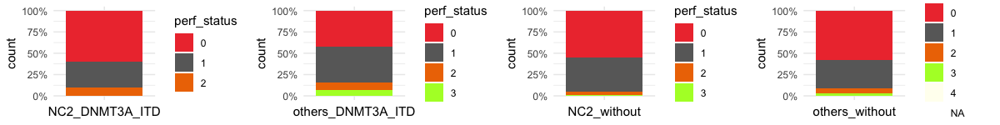

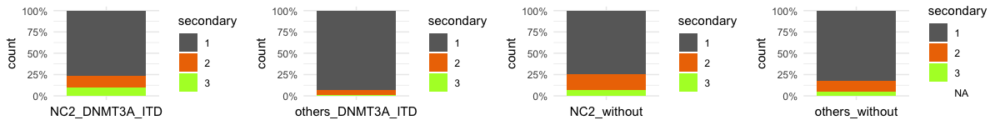

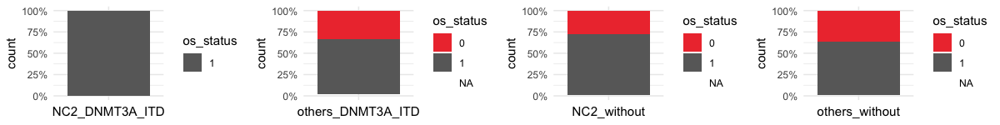

...

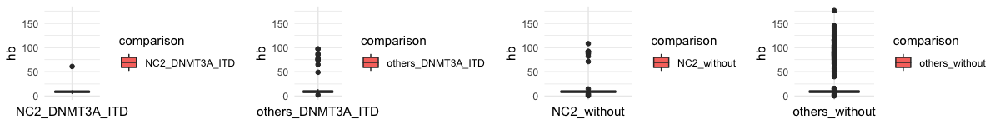

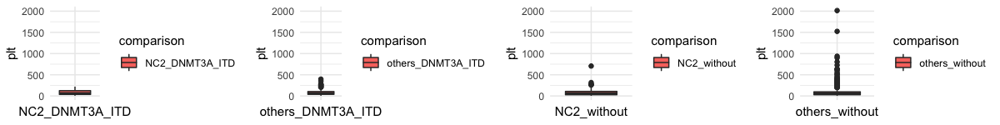

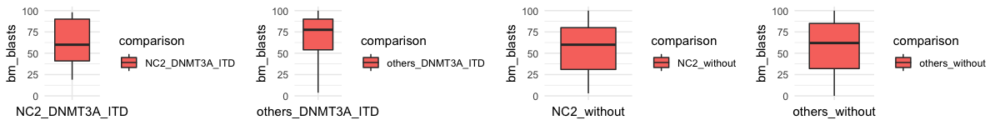

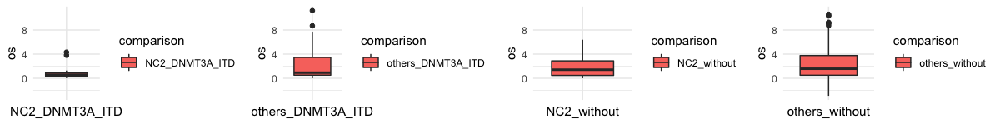

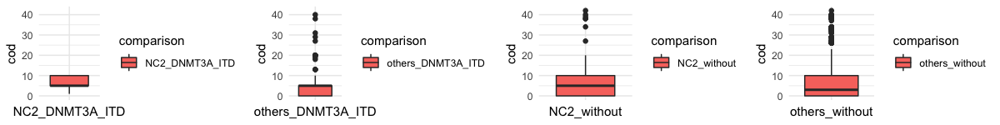

In [609]:
df_c_10$comparison <- ifelse((df_c_10$predicted_component==10) & (df_c_10$DNMT3A==1) & (df_c_10$ITD==1) , "NC2_DNMT3A_ITD",
                      ifelse((df_c_10$predicted_component==10) & !((df_c_10$DNMT3A==1) & (df_c_10$ITD==1)),"NC2_without",
                      ifelse((df_c_10$predicted_component!=10) & (df_c_10$DNMT3A==1) & (df_c_10$ITD==1),"others_DNMT3A_ITD","others_without")))
plottings_comparison(df_c_10[(df_c_10$comparison=="NC2_DNMT3A_ITD"),],
                     df_c_10[(df_c_10$comparison=="others_DNMT3A_ITD"),],
                     df_c_10[(df_c_10$comparison=="NC2_without"),],
                     df_c_10[(df_c_10$comparison=="others_without"),],
          x1="NC2_DNMT3A_ITD",x2="others_DNMT3A_ITD",x3="NC2_without",x4="others_without",many=4,width=12,height=1.5)


<a id='nc2'></a>

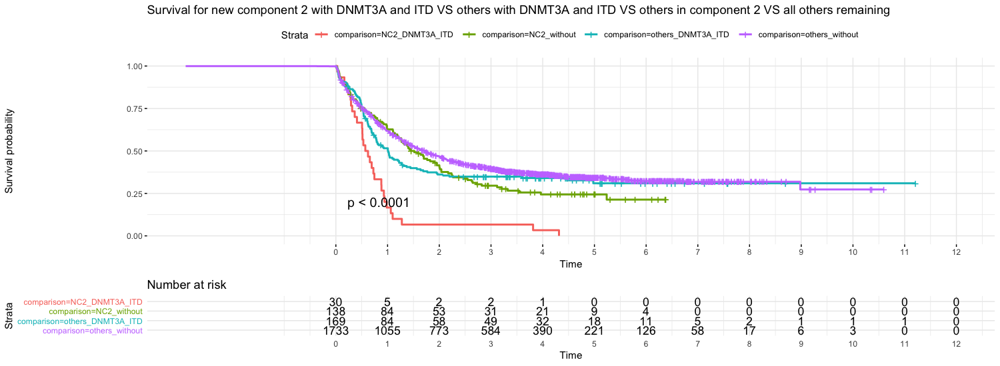

In [613]:
set_notebook_plot_size(15,5.5)
plot_surv(df_c_10,"Survival for new component 2 with DNMT3A and ITD VS others with DNMT3A and ITD VS others in component 2 VS all others remaining")

<a id='investigation'></a>

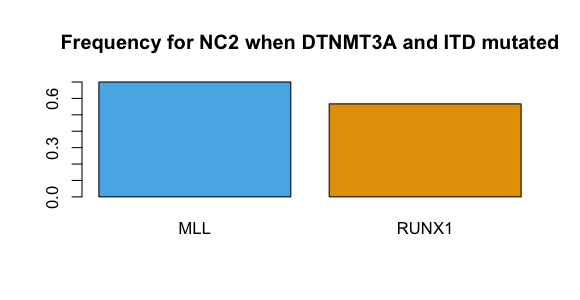

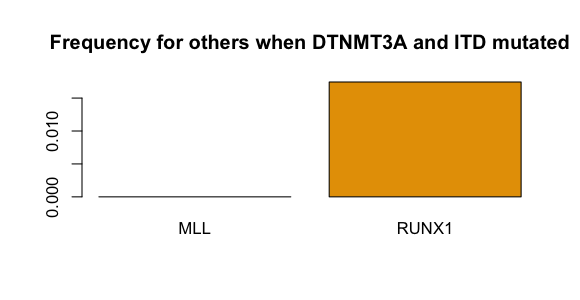

In [610]:
tmp <- merge(df_w_correlates,df_all_components[c("DNMT3A","ITD","BCOR","FLT3_other","MLL","PHF6","RUNX1","SF3B1","U2AF1","WT1")],by=0)
rownames(tmp) <- tmp$Row.names
tmp <- tmp [,-1]

set_notebook_plot_size(5.8,3)
barplot(colSums(tmp[tmp$predicted_component==10 & tmp$DNMT3A==1 & tmp$ITD==1,c(19,21)])/dim(tmp[tmp$predicted_component==10 & tmp$DNMT3A==1 & tmp$ITD==1,c(19,21)])[1],col=c("#56B4E9","#E69F00"),main="Frequency for NC2 when DTNMT3A and ITD mutated")
barplot(colSums(tmp[tmp$predicted_component!=10 & tmp$DNMT3A==1 & tmp$ITD==1,c(19,21)])/dim(tmp[tmp$predicted_component!=10 & tmp$DNMT3A==1 & tmp$ITD==1,c(19,21)])[1],col=c("#56B4E9","#E69F00"),main="Frequency for others when DTNMT3A and ITD mutated")


# Comparison new component 1 VS new component 3 for SRSF2

In [614]:
df_c_11 <- merge(df_w_correlates,df_all_components[c("SRSF2","RUNX1","STAG2")],by=0)
rownames(df_c_11) <- df_c_11$Row.names
df_c_11 <- df_c_11 [,-1]

[1] "Count : NC1_SRSF2_RUNX1_STAG2 : 25"
[1] "Count : NC3_SRSF2 : 44"
[1] "Count : NC1_SRSF2_others : 132"
[1] "Count : NC3_others : 8"


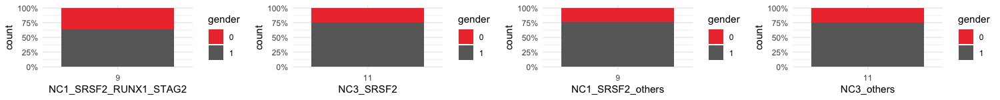

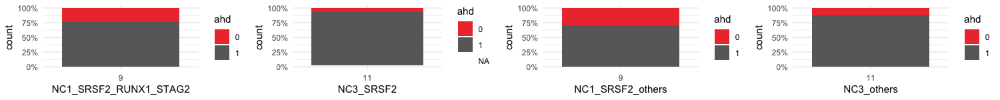

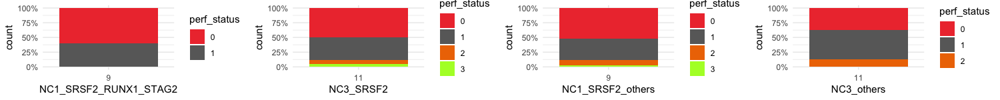

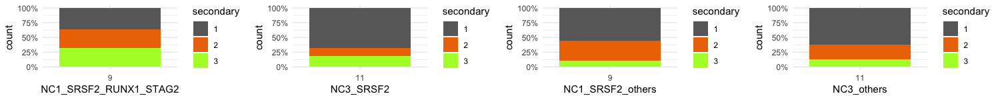

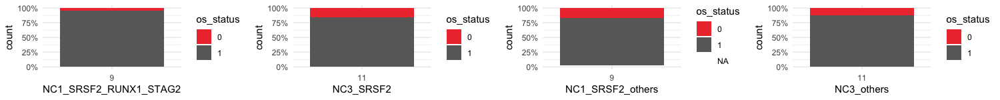

...

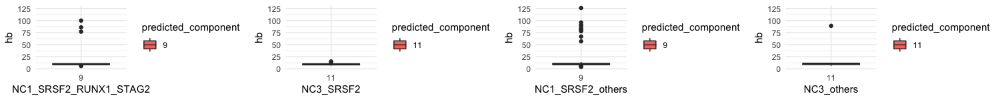

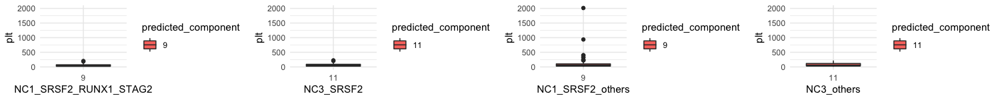

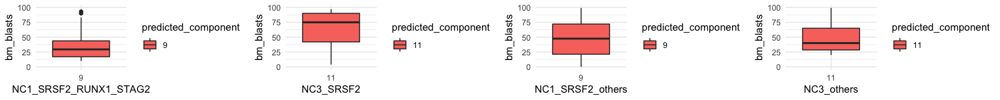

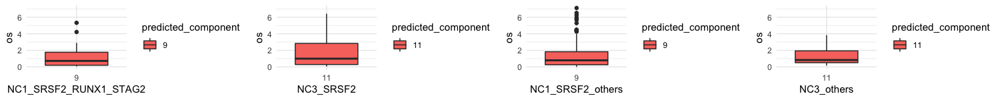

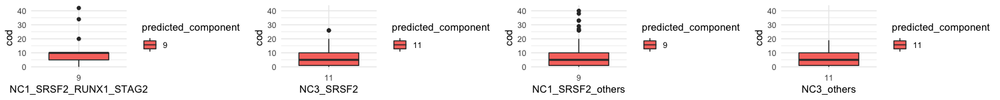

In [221]:
df_c_11$comparison <- ifelse((df_c_11$predicted_component==9) & (df_c_11$SRSF2==1) & (df_c_11$RUNX1==1) & (df_c_11$STAG2==1) , "NC1_SRSF2_RUNX1_STAG2",
                      ifelse((df_c_11$predicted_component==9) & (df_c_11$SRSF2==1) & !((df_c_11$RUNX1==1) & (df_c_11$STAG2==1)),"NC1_SRSF2_others",
                      ifelse((df_c_11$predicted_component==11) & (df_c_11$SRSF2==1),"NC3_SRSF2",
                      ifelse((df_c_11$predicted_component==11) & !(df_c_11$SRSF2==1),"NC3_others","others"))))
plottings(df_c_11[df_c_11$comparison=="NC1_SRSF2_RUNX1_STAG2",],
          df_c_11[df_c_11$comparison=="NC3_SRSF2",],
          df_c_11[df_c_11$comparison=="NC1_SRSF2_others",],
          df_c_11[df_c_11$comparison=="NC3_others",],
          x1="NC1_SRSF2_RUNX1_STAG2",x2="NC3_SRSF2",x3="NC1_SRSF2_others",x4="NC3_others",many=4,width=12,height=1.5)


<a id='nc1-3'></a>

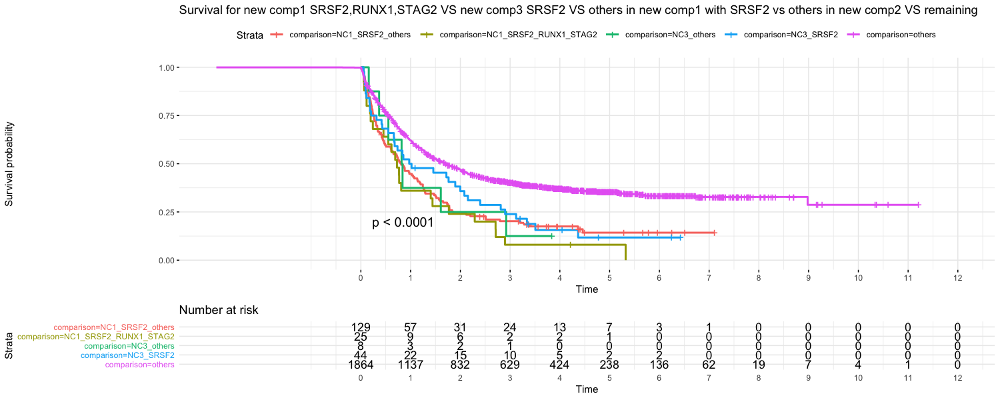

In [228]:
set_notebook_plot_size(15,6)
plot_surv(df_c_11,"Survival for new comp1 SRSF2,RUNX1,STAG2 VS new comp3 SRSF2 VS others in new comp1 with SRSF2 vs others in new comp2 VS remaining")

# New Component 4

In [615]:
df_c_12 <- merge(df_w_correlates,df_all_components[c("DNMT3A","IDH2_p.R172","IDH2_p.R140")],by=0)
rownames(df_c_12) <- df_c_12$Row.names
df_c_12 <- df_c_12 [,-1]

[1] "Count : NC4_DNMT3A_IDH2 : 44"
[1] "Count : NC4_DNMT3A : 5"
[1] "Count : NC4_IDH2 : 8"


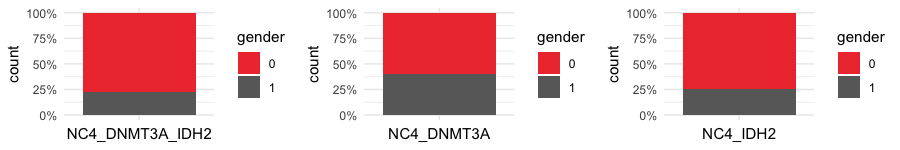

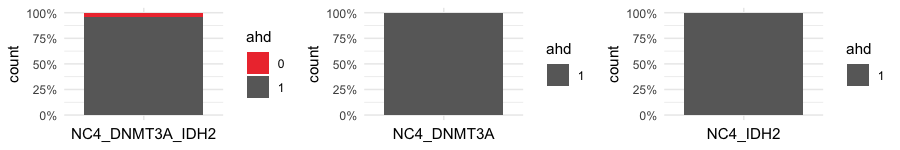

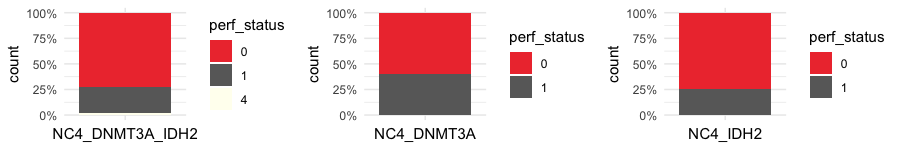

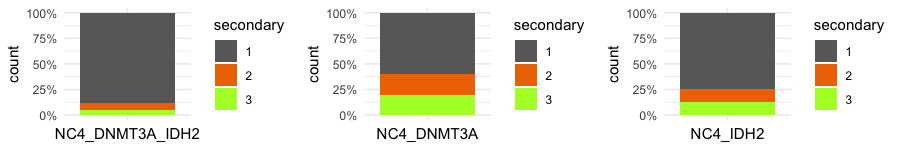

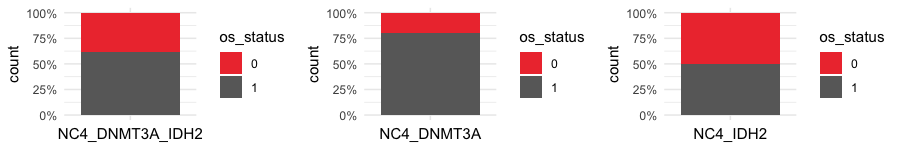

...

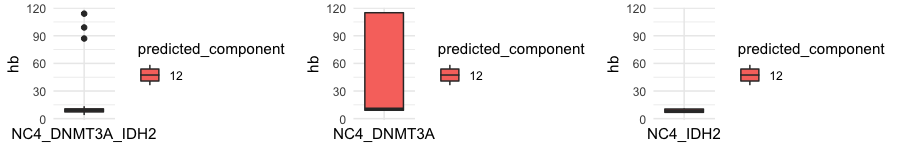

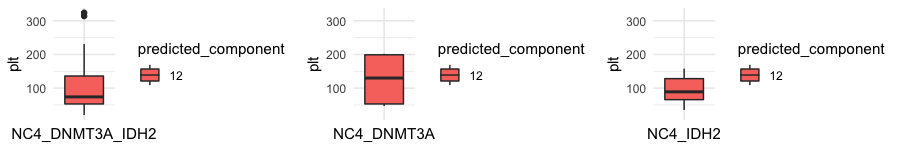

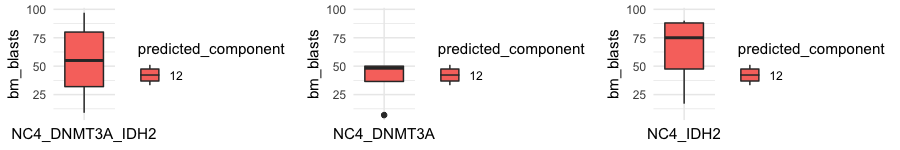

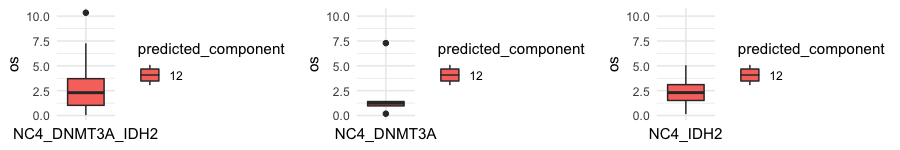

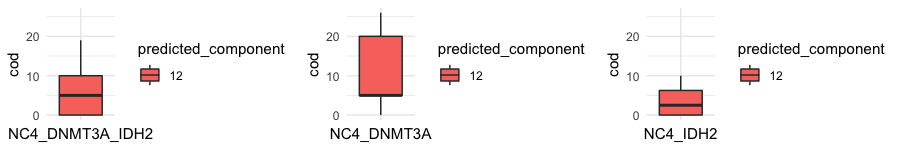

In [616]:
df_c_12$comparison <- ifelse((df_c_12$predicted_component==12) & (df_c_12$DNMT3A==1) & (df_c_12$IDH2_p.R172==1 | df_c_12$IDH2_p.R140==1) , "NC4_DNMT3A_IDH2",
                      ifelse((df_c_12$predicted_component==12) & (df_c_12$DNMT3A==1) & (df_c_12$IDH2_p.R172==0) & (df_c_12$IDH2_p.R140==0),"NC4_DNMT3A",
                      ifelse((df_c_12$predicted_component==12) & (df_c_12$DNMT3A==0) & (df_c_12$IDH2_p.R172==1 | df_c_12$IDH2_p.R140==1),"NC4_IDH2","others")))
plottings(df_c_12[(df_c_12$predicted_component==12) & (df_c_12$DNMT3A==1) & (df_c_12$IDH2_p.R172==1 | df_c_12$IDH2_p.R140==1),],
          df_c_12[(df_c_12$predicted_component==12) & (df_c_12$DNMT3A==1) & (df_c_12$IDH2_p.R172==0) & (df_c_12$IDH2_p.R140==0),],
          df_c_12[(df_c_12$predicted_component==12) & (df_c_12$DNMT3A==0) & (df_c_12$IDH2_p.R172==1 | df_c_12$IDH2_p.R140==1),],
          x1="NC4_DNMT3A_IDH2",x2="NC4_DNMT3A",x3="NC4_IDH2",many=3,width=9,height=1.5)

<a id='nc4'></a>

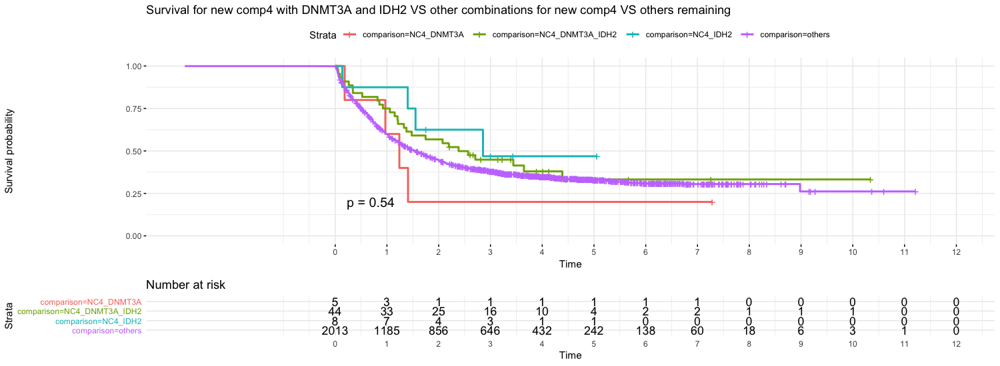

In [617]:
set_notebook_plot_size(15,5.5)
plot_surv(df_c_12,"Survival for new comp4 with DNMT3A and IDH2 VS other combinations for new comp4 VS others remaining")

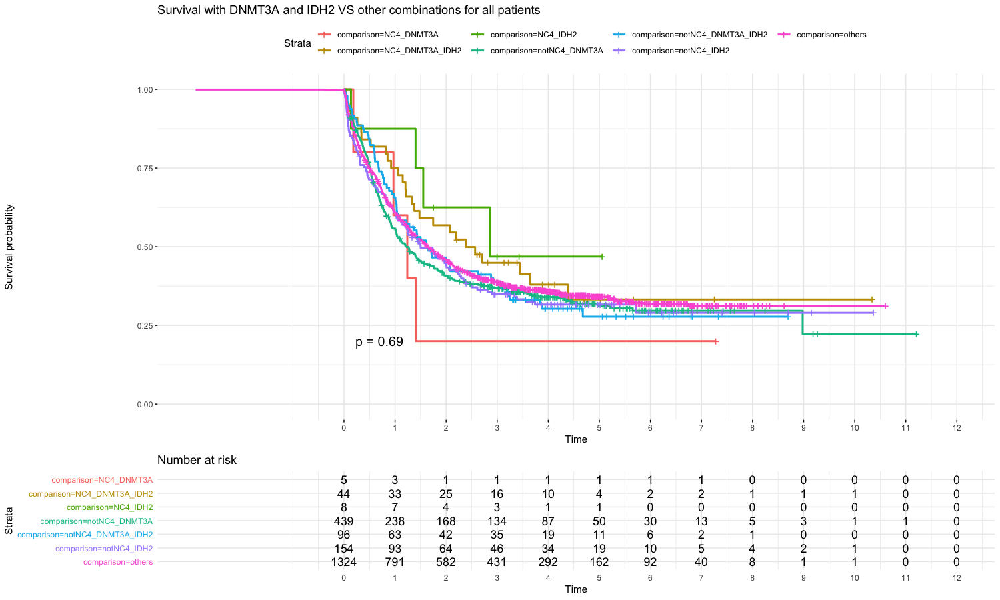

In [618]:
tmp <-df_c_12
tmp$comparison <- ifelse((tmp$predicted_component==12) & (tmp$DNMT3A==1) & (tmp$IDH2_p.R172==1 | tmp$IDH2_p.R140==1) , "NC4_DNMT3A_IDH2",
                  ifelse((tmp$predicted_component==12) & (tmp$DNMT3A==1) & (tmp$IDH2_p.R172==0) & (tmp$IDH2_p.R140==0),"NC4_DNMT3A",
                  ifelse((tmp$predicted_component==12) & (tmp$DNMT3A==0) & (tmp$IDH2_p.R172==1 | tmp$IDH2_p.R140==1),"NC4_IDH2",
                  ifelse((tmp$predicted_component!=12) & (tmp$DNMT3A==1) & (tmp$IDH2_p.R172==1 | tmp$IDH2_p.R140==1) , "notNC4_DNMT3A_IDH2",
                  ifelse((tmp$predicted_component!=12) & (tmp$DNMT3A==1) & (tmp$IDH2_p.R172==0) & (tmp$IDH2_p.R140==0),"notNC4_DNMT3A",
                  ifelse((tmp$predicted_component!=12) & (tmp$DNMT3A==0) & (tmp$IDH2_p.R172==1 | tmp$IDH2_p.R140==1),"notNC4_IDH2",
                             "others"))))))
set_notebook_plot_size(15,9)
plot_surv(tmp,"Survival with DNMT3A and IDH2 VS other combinations for all patients")

# New component 5

In [619]:
df_c_13 <- merge(df_w_correlates,df_all_components[c("t_15_17","complex","RUNX1")],by=0)
rownames(df_c_13) <- df_c_13$Row.names
df_c_13 <- df_c_13 [,-1]

[1] "Count : NC5_t_15_17 : 10"
[1] "Count : NC5_without : 20"
[1] "Count : others_t_15_17 : 11"


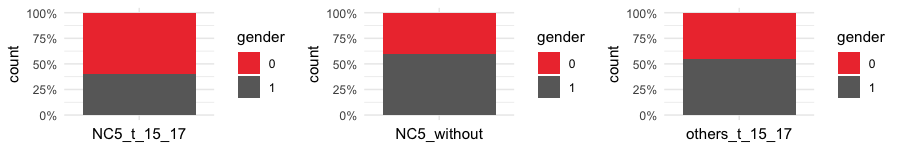

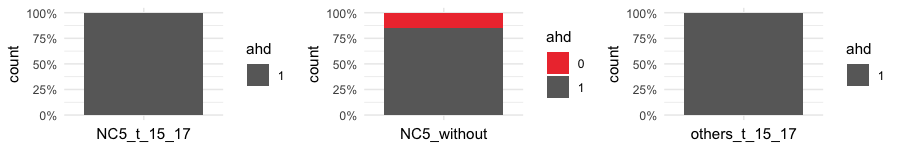

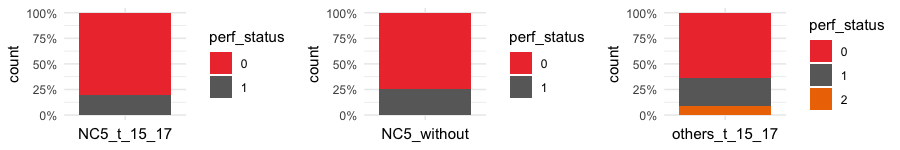

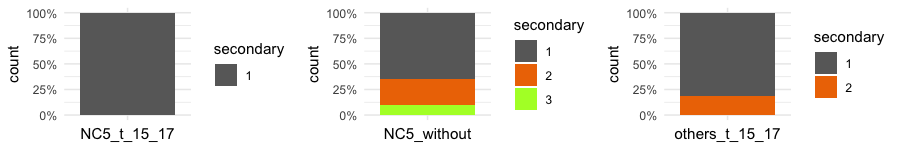

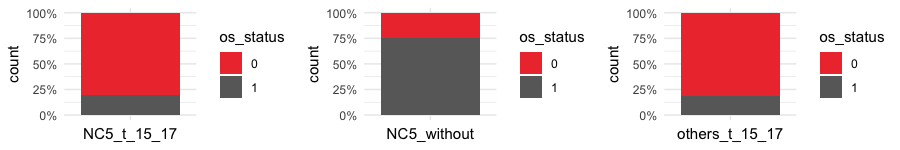

...

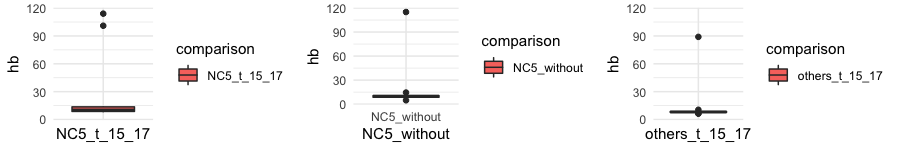

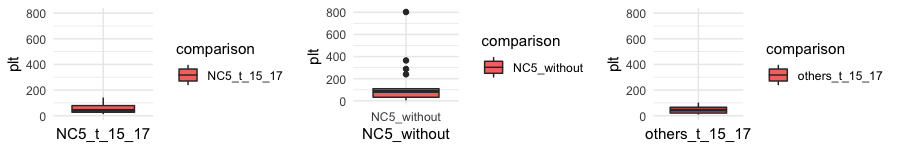

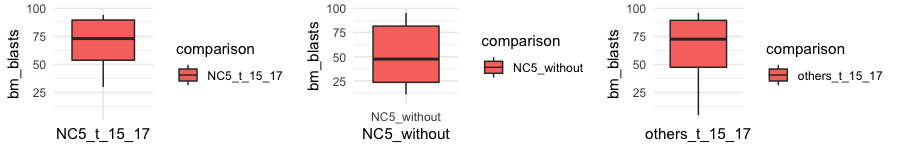

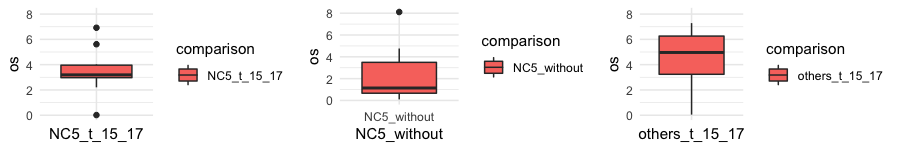

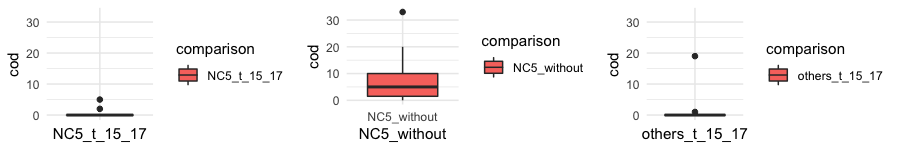

In [620]:
df_c_13$comparison <- ifelse((df_c_13$predicted_component==13) & (df_c_13$t_15_17==1), "NC5_t_15_17",
                      ifelse((df_c_13$predicted_component==13) & (df_c_13$t_15_17==0),"NC5_without",
                      ifelse((df_c_13$predicted_component!=13) & (df_c_13$t_15_17==1),"others_t_15_17","others_without")))

plottings_comparison(df_c_13[df_c_13$comparison=="NC5_t_15_17",],
                     df_c_13[df_c_13$comparison=="NC5_without",],
                     df_c_13[df_c_13$comparison=="others_t_15_17",],
                     x1="NC5_t_15_17",x2="NC5_without",x3="others_t_15_17",many=3,width=9,height=1.5)



<a id='nc5'></a>

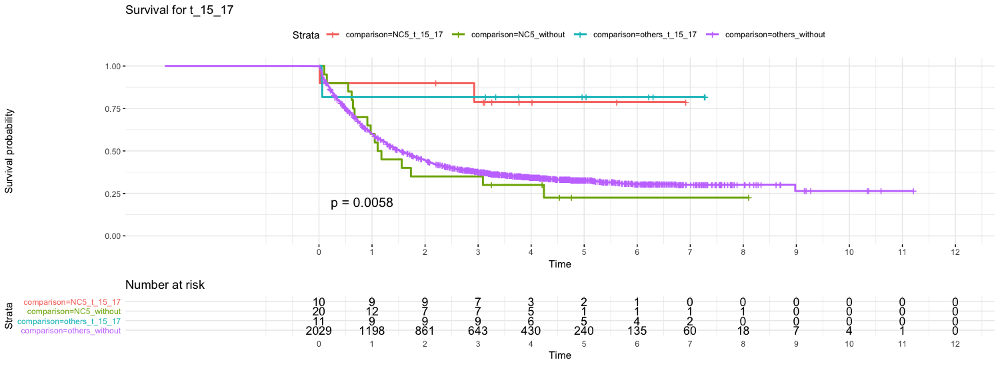

In [623]:
set_notebook_plot_size(15,5.5)
plot_surv(df_c_13,"Survival for t_15_17")

# New component 6

In [303]:
df_c_14 <- merge(df_w_correlates,df_all_components[c("U2AF1","SETBP1","NF1")],by=0)
rownames(df_c_14) <- df_c_14$Row.names
df_c_14 <- df_c_1 [,-1]

[1] "Count : NC6_U2AF1_NF1 : 6"
[1] "Count : NC6_U2AF1_SETBP1 : 6"
[1] "Count : NC6_NF1_SETBP1 : 6"
[1] "Count : NC6_others : 21"


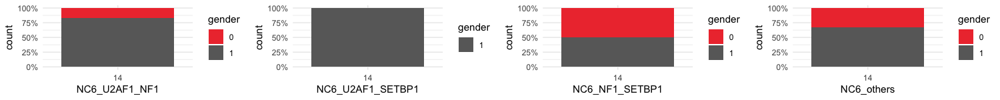

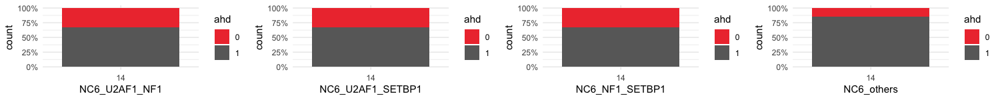

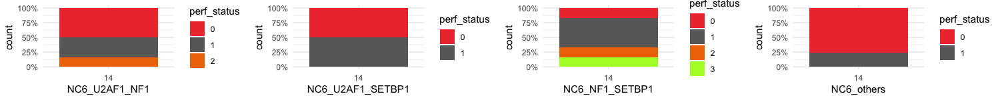

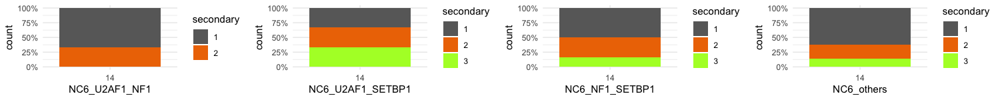

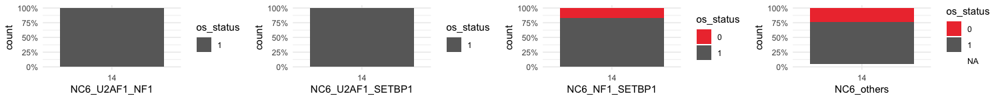

...

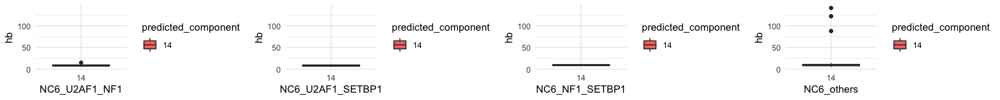

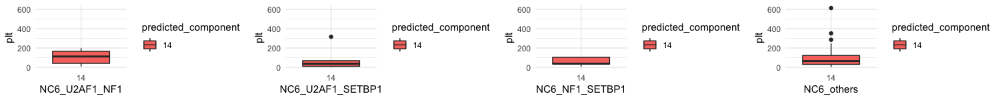

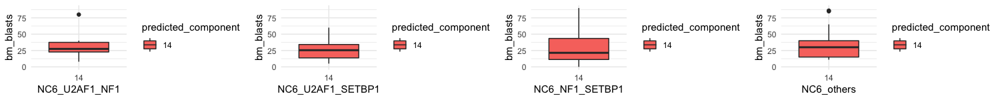

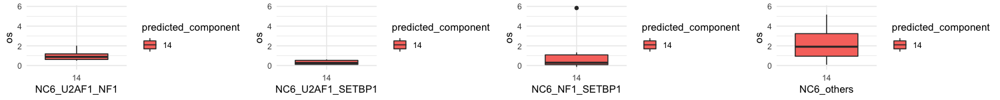

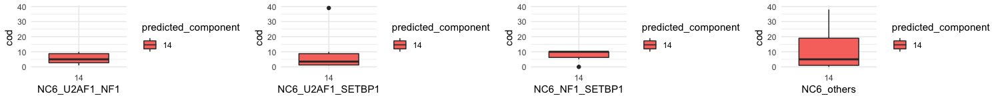

In [335]:
df_c_14$comparison <- ifelse((df_c_14$predicted_component==14) & (df_c_14$U2AF1==1) & (df_c_14$NF1==1) & (df_c_14$SETBP1==0) , "NC6_U2AF1_NF1",
                      ifelse((df_c_14$predicted_component==14) & (df_c_14$U2AF1==1) & (df_c_14$NF1==0) & (df_c_14$SETBP1==1),"NC6_U2AF1_SETBP1",
                      ifelse((df_c_14$predicted_component==14) & (df_c_14$U2AF1==0) & (df_c_14$NF1==1) & (df_c_14$SETBP1==1),"NC6_NF1_SETBP1",
                      ifelse((df_c_14$predicted_component==14) & !((df_c_14$U2AF1==1) & (df_c_14$NF1==1) & (df_c_14$SETBP1==0)) & !((df_c_14$U2AF1==1) & (df_c_14$NF1==0) & (df_c_14$SETBP1==1)) & !((df_c_14$U2AF1==0) & (df_c_14$NF1==1) & (df_c_14$SETBP1==1)),"NC6_others","others"))))
plottings(df_c_14[(df_c_14$predicted_component==14) & (df_c_14$U2AF1==1) & (df_c_14$NF1==1) & (df_c_14$SETBP1==0),],
          df_c_14[(df_c_14$predicted_component==14) & (df_c_14$U2AF1==1) & (df_c_14$NF1==0) & (df_c_14$SETBP1==1),],
          df_c_14[(df_c_14$predicted_component==14) & (df_c_14$U2AF1==0) & (df_c_14$NF1==1) & (df_c_14$SETBP1==1),],
          df_c_14[(df_c_14$predicted_component==14) & !((df_c_14$U2AF1==1) & (df_c_14$NF1==1) & (df_c_14$SETBP1==0)) & !((df_c_14$U2AF1==1) & (df_c_14$NF1==0) & (df_c_14$SETBP1==1)) & !((df_c_14$U2AF1==0) & (df_c_14$NF1==1) & (df_c_14$SETBP1==1)),],
          x1="NC6_U2AF1_NF1",x2="NC6_U2AF1_SETBP1",x3="NC6_NF1_SETBP1",x4="NC6_others",many=4,width=15,height=1.5)

<a id='nc6'></a>

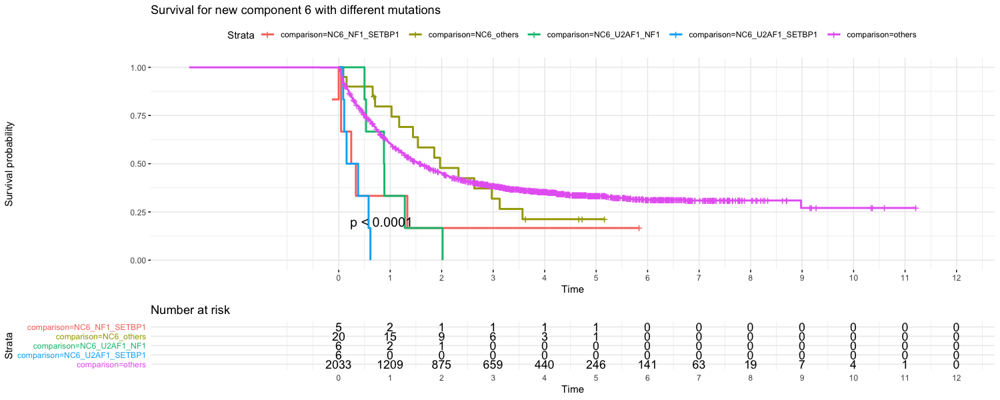

In [625]:
set_notebook_plot_size(15,6)
plot_surv(df_c_14,"Survival for new component 6 with different mutations")

<a id='u2af1'></a>

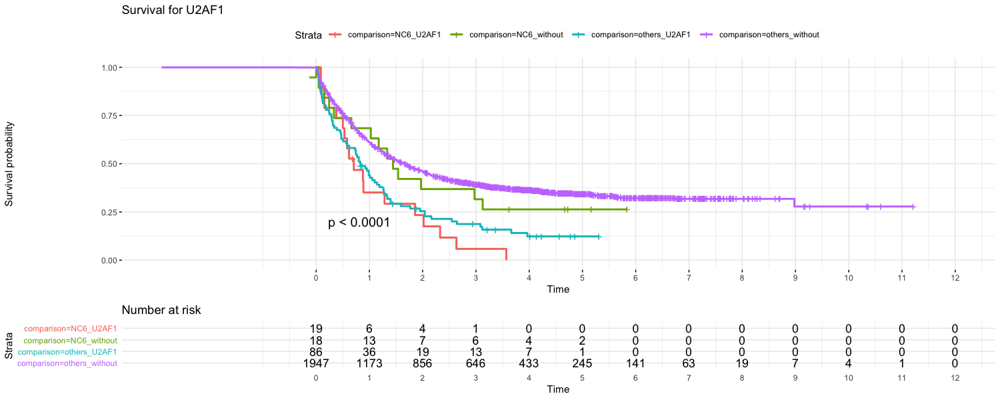

In [341]:
tmp <- merge(df_w_correlates,df_all_components[c("U2AF1","NF1","SETBP1")],by=0)
rownames(tmp) <- tmp$Row.names
tmp <- tmp [,-1]
tmp$comparison <- ifelse((tmp$predicted_component==14) & (tmp$U2AF1==1)   , "NC6_U2AF1",
                  ifelse((tmp$predicted_component==14) & (tmp$U2AF1==0),"NC6_without",
                  ifelse((tmp$predicted_component!=14) & (tmp$U2AF1==1),"others_U2AF1",   
                             "others_without")))
plot_surv(tmp,"Survival for U2AF1 ")

# New component 7

In [626]:
df_c_15 <- merge(df_w_correlates,df_all_components[c("GATA1","JAK3","RAD21")],by=0)
rownames(df_c_15) <- df_c_15$Row.names
df_c_15 <- df_c_15 [,-1]

[1] "Count : NC7_GATA1_JAK3 : 3"
[1] "Count : NC7_others : 2"


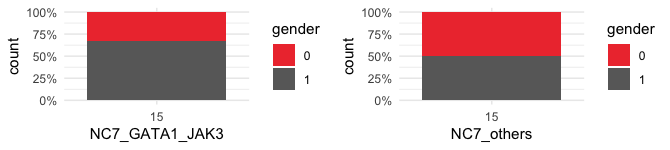

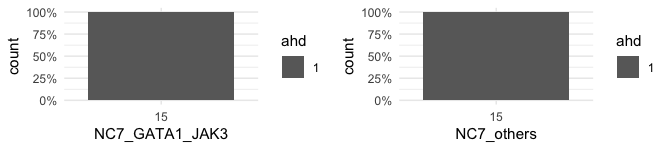

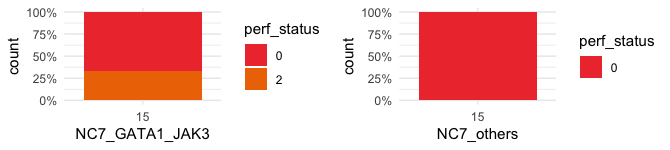

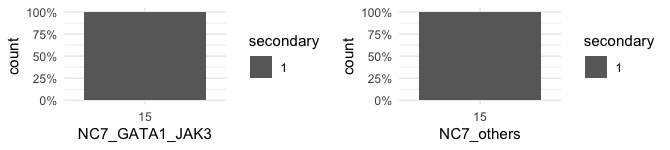

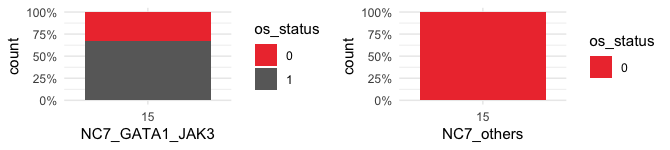

...

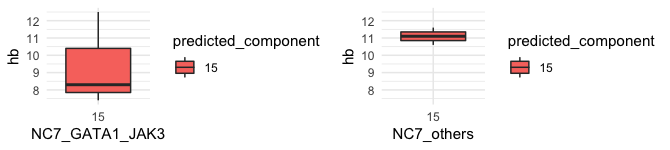

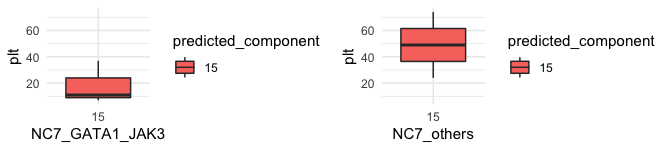

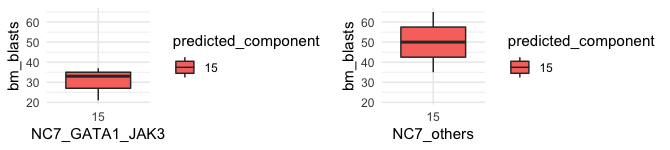

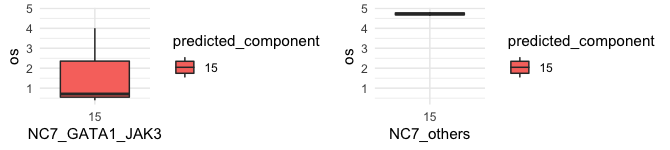

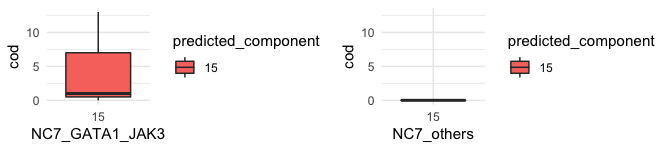

In [377]:
df_c_15$comparison <- ifelse((df_c_15$predicted_component==15) & (df_c_15$GATA1==1) & (df_c_15$JAK3==1) , "NC7_GATA1_JAK3",
                      ifelse((df_c_15$predicted_component==15) & !((df_c_15$GATA1==1) & (df_c_15$JAK3==1)) ,"NC7_others","others"))
plottings(df_c_15[(df_c_15$predicted_component==15) & (df_c_15$GATA1==1) & (df_c_15$JAK3==1),],
          df_c_15[(df_c_15$predicted_component==15) & !((df_c_15$GATA1==1) & (df_c_15$JAK3==1)),],
          x1="NC7_GATA1_JAK3",x2="NC7_others",many=2,width=6.7,height=1.5)
                             


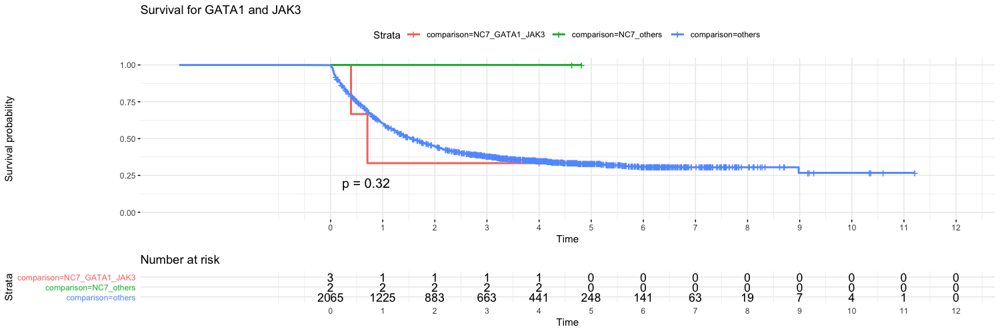

In [378]:
set_notebook_plot_size(15,5)
plot_surv(df_c_15,"Survival for GATA1 and JAK3 ")

<a id='nc7'></a>

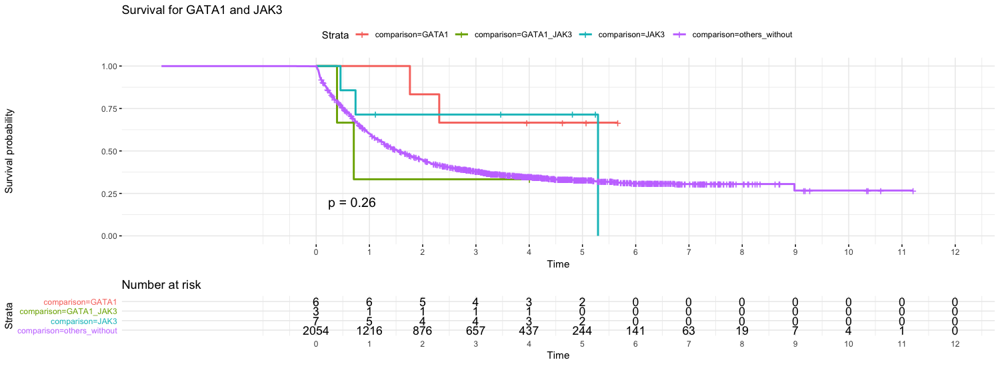

In [389]:
set_notebook_plot_size(15,5.5)
tmp <- merge(df_w_correlates,df_all_components[c("GATA1","JAK3")],by=0)
rownames(tmp) <- tmp$Row.names
tmp <- tmp [,-1]
tmp$comparison <- ifelse((tmp$GATA1==1) & (tmp$JAK3==1)  ,"GATA1_JAK3",
                  ifelse((tmp$JAK3==1),"JAK3",
                  ifelse((tmp$GATA1==1), "GATA1","others_without")))
plot_surv(tmp,"Survival for GATA1 and JAK3")